# **Projeto Final da disciplina Técnicas de Programação I**

### **Descrição**

Este notebook apresenta uma análise de dados feita a partir de datasets de preços e vendas de combustíveis no Brasil, no período de 2017 a 2022. 

### **Identificação da equipe**

**Grupo 3:** Débora Karla, Desiree Criswall, Marianna Rossi, Mohara Nascimento, Pedro Henrique, Renan Dias

**Programa:** Santander Coders 2023

### **Datasets**

O conjunto de dados utilizados neste projeto foi retirado diretamente do banco de dados abertos da Agência Nacional do Petróleo, Gás Natural e Biocombustíveis (ANP) do Brasil. Cujas fontes são as seguintes:

- Série Histórica de Preços de combustíveis: https://www.gov.br/anp/pt-br/centrais-de-conteudo/dados-abertos/serie-historica-de-precos-de-combustiveis

- Vendas de derivados de petróleo e etanol: https://www.gov.br/anp/pt-br/centrais-de-conteudo/dados-abertos/arquivos/vdpb/vendas-derivados-petroleo-e-etanol/

A partir da fonte "Série Histórica de Preços de combustíveis" realizamos o download dos arquivos de combustíveis automotivos referentes ao período de interesse, do 1º semestre de 2017 ao 2º semestre de 2022 ("ca-2017-01.csv" a "ca-2022-02.csv"). Em relação às informações de "Vendas de derivados de petróleo e etanol" foi necessário fazer o download de apenas um arquivo, intitulado de "vendas-derivados-petroleo-etanol-m3-1990-2023.csv", o qual traz o histórico de vendas de 1990 a 2023.

### **Metodologia**

No presente trabalho optou-se por separar a análise dos datasets por Regiões do Brasil, para isso, fizemos a seguinte divisão: Pedro - Região Nordeste, Marianna - Região Norte, Mohara - Região Centro-Oeste, Renan - Região Sudeste,  Desiree - Região Sul e Débora - Análise Nacional. Cada membro ficou responsável por fazer análises levando em conta o período de 2017 a 2022. Além disso, formulamos em conjunto cinco perguntas para serem respondidas, em que as quatro iniciais são referentes aos datasets de preços e a última envolve a análise conjunta dos datasets de preço com o de vendas.

### **1. Importação das bibliotecas**

In [176]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import glob
from plotnine import *
from datetime import datetime
from scipy.stats import norm, linregress
from typing import List
from empiricaldist import Pmf, Cdf

### **2. Carregamento dos dados**

Nesta etapa é importante destacar que organizamos os dados em duas subpastas nomeadas de "precos" e "vendas", contidas dentro da pasta "Datasets", para a reprodução deste código é necessário que este notebook esteja no mesmo path da pasta "Datasets". Em suma, quase todos os arquivos vieram com a seguinte sintaxe: "ca-ano-semestre.csv" o único que não veio desta forma foi o de 2022.1, o qual foi renomeado para "ca-2021-02.csv" mantendo o padrão.

**2.1 Dados de preços**

In [177]:
# Utilizamos a função glob para listar todos os arquivos .csv contidos dentro da pasta "precos" e salvamos essa lista em arquivos_precos

arquivos_precos = glob.glob('./Datasets/precos/*.csv')

# Com a lista de arquivos salva, ordenamos para obter uma ordem cronológica de arquivos, conforme mostrado a seguir

files=sorted(arquivos_precos)
files

['./Datasets/precos\\ca-2017-01.csv',
 './Datasets/precos\\ca-2017-02.csv',
 './Datasets/precos\\ca-2018-01.csv',
 './Datasets/precos\\ca-2018-02.csv',
 './Datasets/precos\\ca-2019-01.csv',
 './Datasets/precos\\ca-2019-02.csv',
 './Datasets/precos\\ca-2020-01.csv',
 './Datasets/precos\\ca-2020-02.csv',
 './Datasets/precos\\ca-2021-01.csv',
 './Datasets/precos\\ca-2021-02.csv',
 './Datasets/precos\\ca-2022-01.csv',
 './Datasets/precos\\ca-2022-02.csv']

**2.2 Dados de vendas**

In [178]:
# De forma análoga, salvamos o arquivo de vendas

vendas = glob.glob('./Datasets/vendas/*.csv')
vendas

['./Datasets/vendas\\vendas-combustiveis-m3-1990-2023.csv']

### **3. Limpeza e tratamento dos dados**

**3.1 Dados de preços**

3.1.1 Funções auxiliares para limpeza e tratamento

In [179]:
# remover espaços e hifens e substituir por underline
tirar_espacos_lower_case = lambda x: x.replace(r' - ', '_').lower().replace(' ', '_')

def converter_colunas_para_float(df:pd.DataFrame, *args) -> None:
    for column in args:
        df[column] = df[column].str.replace(',', '.').astype('float64')

# retirar trailing spaces de colunas string
def remover_trailing_spaces(df:pd.DataFrame, *args) -> None:
    for column in args:
        df[column] = df[column].apply(lambda x: x.strip())

3.1.2 Criação e organização do dataframe de preços

In [180]:
# inicialização do dataframe e uma lista das colunas que não serão utilizadas, para que sejam dropadas
precos_df = pd.DataFrame()
drop_columns = ['municipio', 'revenda', 'nome_da_rua', 'numero_rua', 'complemento', 'bairro', 'cep', 'valor_de_compra','unidade_de_medida']

# função para evitar erro na leitura dos arquivos
def ler_csv(file_name:str, *args):
    for _ in args:
        try:
            df = pd.read_csv(file_name, delimiter=';', encoding=_, parse_dates=['Data da Coleta'], date_format='%d/%m/%Y', dtype={'Valor de Compra':str})
        except:
            print('tentando o proximo metodo...')
            continue
        else:
            return df

# loop para salvar de forma concatenada os dados de cada arquivo no dataframe precos_df
for file in files:
    d= ler_csv(file, 'utf-8', 'latin-1')
    
    d.rename(columns=tirar_espacos_lower_case, inplace=True)

    d.drop(drop_columns, axis=1, inplace=True)

    converter_colunas_para_float(d, 'valor_de_venda')

    precos_df = pd.concat([precos_df, d], axis=0, ignore_index=True)

tentando o proximo metodo...


3.1.3 Visão geral do dataframe

In [181]:
# verificar se o dataframe está começando em 2017.01

precos_df.head()

,regiao_sigla,estado_sigla,cnpj_da_revenda,produto,data_da_coleta,valor_de_venda,bandeira
0,SE,SP,49.051.667/0001-02,GASOLINA,2017-01-03,3.6990,PETROBRAS DISTRIBUIDORA S.A.
1,SE,SP,49.051.667/0001-02,ETANOL,2017-01-03,2.8990,PETROBRAS DISTRIBUIDORA S.A.
2,SE,SP,49.051.667/0001-02,DIESEL,2017-01-03,2.9590,PETROBRAS DISTRIBUIDORA S.A.
3,SE,SP,49.051.667/0001-02,DIESEL S10,2017-01-03,3.0790,PETROBRAS DISTRIBUIDORA S.A.
4,SE,SP,49.051.667/0001-02,GNV,2017-01-03,2.0990,PETROBRAS DISTRIBUIDORA S.A.


In [182]:
# verificar se o dataframe está terminando em 2022.02

precos_df.tail()

,regiao_sigla,estado_sigla,cnpj_da_revenda,produto,data_da_coleta,valor_de_venda,bandeira
5189971,S,SC,31.603.614/0001-91,GASOLINA,2022-12-30,5.0400,MAXSUL
5189972,S,SC,31.603.614/0001-91,DIESEL S10,2022-12-30,6.1900,MAXSUL
5189973,S,SC,03.283.593/0006-43,GASOLINA ADITIVADA,2022-12-30,5.3100,VIBRA ENERGIA
5189974,S,SC,03.283.593/0006-43,GASOLINA,2022-12-30,5.1100,VIBRA ENERGIA
5189975,S,SC,31.713.751/0002-60,GASOLINA,2022-12-30,5.0900,IPIRANGA


In [183]:
# verificar se há valores nulos e quantos são

precos_df.isnull().sum()

regiao_sigla       0
estado_sigla       0
cnpj_da_revenda    0
produto            0
data_da_coleta     0
valor_de_venda     0
bandeira           0
dtype: int64

In [184]:
# informacoes do dataframe

precos_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5189976 entries, 0 to 5189975
Data columns (total 7 columns):
 #   Column           Dtype         
---  ------           -----         
 0   regiao_sigla     object        
 1   estado_sigla     object        
 2   cnpj_da_revenda  object        
 3   produto          object        
 4   data_da_coleta   datetime64[ns]
 5   valor_de_venda   float64       
 6   bandeira         object        
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 277.2+ MB


Com as funções head() e tail() podemos ver que o dataframe está no intervalo de anos esperado. Já com o isnull().sum() podemos verificar que não há nenhuma coluna com valores nulos, o que significa que não precisamos fazer nenhum tratamento relativo a isso. Por fim, o info() nos mostrou que todos os dados estão nos formatos (Dtype) corretos.

**3.2 Dados de vendas**

3.2.1 Criação e organização do dataframe de vendas

In [185]:
vendas_df = pd.read_csv(vendas[0], delimiter=';')
vendas_df.rename(columns=tirar_espacos_lower_case, inplace=True)

3.2.2 Visão geral do dataframe

In [186]:
vendas_df.head()

,ano,mês,grande_região,unidade_da_federação,produto,vendas
0,1999,MAR,REGIÃO NORTE,RONDÔNIA,ETANOL HIDRATADO,"1326,2"
1,1999,MAI,REGIÃO NORTE,RONDÔNIA,ETANOL HIDRATADO,"1099,1"
2,1999,ABR,REGIÃO NORTE,RONDÔNIA,ETANOL HIDRATADO,"912,75"
3,1999,SET,REGIÃO NORTE,RONDÔNIA,ETANOL HIDRATADO,"1375,304"
4,1999,FEV,REGIÃO NORTE,RONDÔNIA,ETANOL HIDRATADO,"823,1"


In [187]:
vendas_df.tail()

,ano,mês,grande_região,unidade_da_federação,produto,vendas
86827,2006,OUT,REGIÃO NORTE,RONDÔNIA,ÓLEO DIESEL,"69317,219"
86828,2006,AGO,REGIÃO NORTE,RONDÔNIA,ÓLEO DIESEL,"55580,042"
86829,2006,MAR,REGIÃO NORTE,RONDÔNIA,ÓLEO DIESEL,"48692,078"
86830,2006,ABR,REGIÃO NORTE,RONDÔNIA,ÓLEO DIESEL,"43319,044"
86831,2006,NOV,REGIÃO NORTE,RONDÔNIA,ÓLEO DIESEL,"69467,456"


In [188]:
vendas_df.isnull().sum()

ano                     0
mês                     0
grande_região           0
unidade_da_federação    0
produto                 0
vendas                  0
dtype: int64

In [189]:
vendas_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86832 entries, 0 to 86831
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   ano                   86832 non-null  int64 
 1   mês                   86832 non-null  object
 2   grande_região         86832 non-null  object
 3   unidade_da_federação  86832 non-null  object
 4   produto               86832 non-null  object
 5   vendas                86832 non-null  object
dtypes: int64(1), object(5)
memory usage: 4.0+ MB


Com as informações observadas, não precisamos fazer fazer tratamento de valores nulos, pois não constam no nosso dataframe, mas precisamos corrigir o tipo da coluna de vendas que está como *object* e deve ser *float64*. Também precisamos eliminar os anos que não constam no nosso intervalo de análise (2017 a 2023). A seguir essas mudanças serão feitas.

3.2.3 Casting do tipo da coluna vendas para *float64*



In [190]:
# Casting vendas, de object para float64

if vendas_df['vendas'].dtype == 'O':
    vendas_df['vendas'] = vendas_df['vendas'].str.replace(',', '.').astype('float64')
    
vendas_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86832 entries, 0 to 86831
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   ano                   86832 non-null  int64  
 1   mês                   86832 non-null  object 
 2   grande_região         86832 non-null  object 
 3   unidade_da_federação  86832 non-null  object 
 4   produto               86832 non-null  object 
 5   vendas                86832 non-null  float64
dtypes: float64(1), int64(1), object(4)
memory usage: 4.0+ MB


3.2.4 Criando a coluna data, fazendo seu respectivo *casting* e *setando* para *index*

In [191]:
# verificar como os meses aparecem no dataset

vendas_df['mês'].unique()

array(['MAR', 'MAI', 'ABR', 'SET', 'FEV', 'JAN', 'AGO', 'JUL', 'DEZ',
       'JUN', 'OUT', 'NOV'], dtype=object)

In [192]:
# mudar esses meses para o formato de data

index_months = list(enumerate(['JAN', 'FEV', 'MAR', 'ABR', 'MAI', 'JUN', 'JUL', 'AGO', 'SET', 'OUT', 'NOV', 'DEZ'], start=1))

def get_month_num(series:pd.Series, index_months:list) -> list:
    return [i for month in series for i, m in index_months if m == month]

vendas_df['mes_num'] = get_month_num(vendas_df['mês'], index_months)

def criar_data(df, nova_coluna:str, series_1:pd.Series, series_2:pd.Series):
    df[nova_coluna] = [pd.Period(f'{year}-{month}', 'M').asfreq('M') for year, month in zip(series_1, series_2)]
    
criar_data(vendas_df, 'data', vendas_df['ano'], vendas_df['mes_num'])

In [193]:
# colocar os anos como index para eliminar posteriormente os anos forma do intervalo de 2017 a 2022

vendas_df.drop(['mês', 'mes_num'], axis=1, inplace=True)
vendas_df.set_index('ano', inplace=True)
vendas_df.sort_index(inplace=True)
vendas_aux = vendas_df

In [194]:
vendas_df.head()

,grande_região,unidade_da_federação,produto,vendas,data
ano,,,,,
1990,REGIÃO SUDESTE,RIO DE JANEIRO,QUEROSENE DE AVIAÇÃO,98797.1770,1990-06
1990,REGIÃO CENTRO-OESTE,MATO GROSSO,QUEROSENE ILUMINANTE,58.6000,1990-02
1990,REGIÃO CENTRO-OESTE,MATO GROSSO,QUEROSENE ILUMINANTE,55.9600,1990-05
1990,REGIÃO CENTRO-OESTE,MATO GROSSO DO SUL,QUEROSENE ILUMINANTE,57.7000,1990-08
1990,REGIÃO CENTRO-OESTE,MATO GROSSO DO SUL,QUEROSENE ILUMINANTE,95.1000,1990-07


In [195]:
vendas_df.tail()

,grande_região,unidade_da_federação,produto,vendas,data
ano,,,,,
2023,REGIÃO NORTE,PARÁ,ÓLEO DIESEL,248236.4360,2023-06
2023,REGIÃO NORTE,RORAIMA,ÓLEO DIESEL,19456.7000,2023-03
2023,REGIÃO NORTE,AMAZONAS,GASOLINA DE AVIAÇÃO,0.0000,2023-04
2023,REGIÃO CENTRO-OESTE,MATO GROSSO,QUEROSENE ILUMINANTE,0.0000,2023-01
2023,REGIÃO NORTE,AMAPÁ,QUEROSENE DE AVIAÇÃO,343.5370,2023-06


Como pode ser visto no pelo head() e o tail() o período do dataframe está bem maior que o que desejamos. Enquanto nossa análise se focará no período de 2017 a 2022 o dataframe traz dados de 1999 a 2023, de forma que eliminaremos os anos indesejados(fora do período a ser analisado).

In [196]:
# eliminando as linhas de 1990 a 2016 e 2023

vendas_df.drop((n for n in range(1990,2017)), inplace=True)
vendas_df.drop(2023, inplace=True)
vendas_df.head()

,grande_região,unidade_da_federação,produto,vendas,data
ano,,,,,
2017,REGIÃO SUL,SANTA CATARINA,GASOLINA C,230318.7340,2017-08
2017,REGIÃO SUL,SANTA CATARINA,GASOLINA C,232111.7380,2017-10
2017,REGIÃO SUL,SANTA CATARINA,GASOLINA C,227562.0210,2017-07
2017,REGIÃO NORDESTE,BAHIA,GASOLINA C,173002.0920,2017-11
2017,REGIÃO SUL,PARANÁ,GASOLINA C,267466.3340,2017-05


In [197]:
vendas_df.tail()

,grande_região,unidade_da_federação,produto,vendas,data
ano,,,,,
2022,REGIÃO NORTE,RONDÔNIA,ÓLEO DIESEL,69955.4490,2022-04
2022,REGIÃO NORTE,RONDÔNIA,ÓLEO DIESEL,77155.5060,2022-05
2022,REGIÃO NORTE,RONDÔNIA,ÓLEO DIESEL,112327.7100,2022-02
2022,REGIÃO NORTE,RORAIMA,ÓLEO DIESEL,25150.2500,2022-11
2022,REGIÃO NORTE,AMAZONAS,ETANOL HIDRATADO,12129.8580,2022-06


Com o intervalo devidamente estabelecido podemos trocar o índice de ano para data

In [198]:
vendas_df.set_index('data', inplace=True)
vendas_df.sort_index(inplace=True)
vendas_df

,grande_região,unidade_da_federação,produto,vendas
data,,,,
2017-01,REGIÃO NORTE,AMAPÁ,ÓLEO DIESEL,9204.4257
2017-01,REGIÃO SUDESTE,ESPÍRITO SANTO,QUEROSENE DE AVIAÇÃO,3025.7160
2017-01,REGIÃO NORTE,ACRE,QUEROSENE ILUMINANTE,0.0000
2017-01,REGIÃO NORTE,ACRE,QUEROSENE DE AVIAÇÃO,1008.5600
2017-01,REGIÃO SUL,SANTA CATARINA,ÓLEO COMBUSTÍVEL,3865.0300
...,...,...,...,...
2022-12,REGIÃO CENTRO-OESTE,MATO GROSSO DO SUL,GASOLINA C,82828.3600
2022-12,REGIÃO NORTE,ACRE,GLP,3317.2935
2022-12,REGIÃO CENTRO-OESTE,MATO GROSSO,GASOLINA C,63713.8000


**3.3. Agrupamento dos dados e tratamentos para correlação entre os datasets de preços e vendas**


Nesta etapa é importante notar que o nosso dataframe de preços tem uma frequência diária, ou seja, os valores são listados dia a dia, enquanto que a base de dados de vendas apresenta uma frequência mensal, com a quantidade de vendas sendo listada mês a mês. De forma que para fazer uma futura correlação entre esses dois dataframes é preciso padronizar o período temporal. O primeiro passo para isso é fazer com que o dataframe de preços tenha registros mensais e não diários. Para isso, nós utilizamos um groupby com resample mensal que agrupa os valores de todos dias de cada mês em uma data única data mensal. 

- Observação: nossa análise será feita por regiões do Brasil, por bandeira e por produto, de forma que os agrupamentos serão feitos com as colunas que refletem esses dados.

In [199]:
# salvar o dataframe de precos em um outro dataframe que só será usado nas perguntas que envolverem correlação
precos_corr_df = precos_df

precos_corr_df.rename(columns={"data_da_coleta":"data"}, inplace=True)

precos_corr_df = precos_corr_df.set_index('data', drop=True)\
.groupby(['regiao_sigla', 'produto', 'bandeira'])\
.resample('M')['valor_de_venda']\
.agg([np.mean, np.median, np.min, np.max])\
.reset_index().set_index('data', drop=True).sort_index()

In [200]:
precos_corr_df.head()

,regiao_sigla,produto,bandeira,mean,median,min,max
data,,,,,,,
2017-01-31,NE,DIESEL,BRANCA,3.0756,3.0800,2.7300,3.4900
2017-01-31,CO,DIESEL S10,RIO BRANCO,3.2618,3.3000,3.2000,3.3000
2017-01-31,SE,DIESEL,ACOL,3.0916,3.1400,2.9890,3.1980
2017-01-31,NE,DIESEL S10,ALESAT,3.2687,3.2990,2.7900,3.5390
2017-01-31,NE,GASOLINA,DISLUB,3.6795,3.6990,3.2300,3.9990


In [201]:
# precos_df['data'] = precos_df['data'].dt.strftime('%Y-%m')

precos_corr_df = precos_corr_df.set_index(pd.to_datetime(precos_corr_df.reset_index()['data']).apply(lambda x: x.to_period('M')), drop=True).sort_index()

In [202]:
precos_corr_df

,regiao_sigla,produto,bandeira,mean,median,min,max
data,,,,,,,
2017-01,NE,DIESEL,BRANCA,3.0756,3.0800,2.7300,3.4900
2017-01,CO,DIESEL S10,RIO BRANCO,3.2618,3.3000,3.2000,3.3000
2017-01,SE,DIESEL,ACOL,3.0916,3.1400,2.9890,3.1980
2017-01,NE,DIESEL S10,ALESAT,3.2687,3.2990,2.7900,3.5390
2017-01,NE,GASOLINA,DISLUB,3.6795,3.6990,3.2300,3.9990
...,...,...,...,...,...,...,...
2022-12,S,GASOLINA,ALESAT,5.1084,5.0900,4.6900,5.4300
2022-12,S,GASOLINA,AMERICANOIL,5.1500,5.1500,5.1500,5.1500
2022-12,CO,GASOLINA,MASUT DISTRIBUIDORA,4.9570,4.8550,4.7500,5.3900


In [203]:
vendas_df = vendas_df.groupby(['data','grande_região', 'produto'])[['vendas']].sum().reset_index().set_index('data',drop=True)

In [204]:
vendas_df

,grande_região,produto,vendas
data,,,
2017-01,REGIÃO CENTRO-OESTE,ETANOL HIDRATADO,119784.3100
2017-01,REGIÃO CENTRO-OESTE,GASOLINA C,346785.2460
2017-01,REGIÃO CENTRO-OESTE,GASOLINA DE AVIAÇÃO,740.0300
2017-01,REGIÃO CENTRO-OESTE,GLP,89158.8822
2017-01,REGIÃO CENTRO-OESTE,QUEROSENE DE AVIAÇÃO,52297.4390
...,...,...,...
2022-12,REGIÃO SUL,GLP,186459.4601
2022-12,REGIÃO SUL,QUEROSENE DE AVIAÇÃO,32939.5630
2022-12,REGIÃO SUL,QUEROSENE ILUMINANTE,84.0000


- Tratamento final: padronizar as colunas dos dois dataframes

Os índices (datas) das colunas dos dois dataframes já estão no mesmo padrão, porém o nome da região do Brasil e os produtos não, de forma que precisamos tratar esses dados.

In [205]:
# colocar a coluna de região com o mesmo nome e mesma sintaxe

precos_corr_df.rename(columns={"regiao_sigla":"regiao"}, inplace=True)
vendas_df.rename(columns={"grande_região":"regiao"}, inplace=True)

regiao = {'REGIÃO NORDESTE':'NE', 'REGIÃO NORTE':'N', 'REGIÃO CENTRO-OESTE':'CO', 'REGIÃO SUDESTE':'SE', 'REGIÃO SUL':'S'}

vendas_df = vendas_df.replace(regiao.keys(),regiao.values())

In [206]:
# verificar os produtos únicos dos dois dataframes
print(precos_corr_df['produto'].unique())
print(vendas_df['produto'].unique())

['DIESEL' 'DIESEL S10' 'GASOLINA' 'ETANOL' 'GNV' 'GASOLINA ADITIVADA']
['ETANOL HIDRATADO' 'GASOLINA C' 'GASOLINA DE AVIAÇÃO' 'GLP'
 'QUEROSENE DE AVIAÇÃO' 'QUEROSENE ILUMINANTE' 'ÓLEO COMBUSTÍVEL'
 'ÓLEO DIESEL']


In [207]:
# renomear os produtos do dataframe de vendas com os nomes equivalentes do dataframe de precos

vendas_df = vendas_df.replace('ETANOL HIDRATADO','ETANOL')
vendas_df = vendas_df.replace('GASOLINA C','GASOLINA')
vendas_df = vendas_df.replace('ÓLEO DIESEL','DIESEL')


# deixar no dataframe de vendas apenas os combustíveis que estão contidos no dataframe de precos e eliminar os demais

vendas_df = vendas_df.reset_index().set_index('produto',drop=True)
vendas_df.drop(['QUEROSENE DE AVIAÇÃO','QUEROSENE ILUMINANTE', 'ÓLEO COMBUSTÍVEL', 'GASOLINA DE AVIAÇÃO', 'GLP'], inplace=True)
vendas_df = vendas_df.reset_index().set_index('regiao',drop=True) # esta linha é apenas para manter a região antes do produto na tabela
# vendas_df = vendas_df.reset_index().set_index('data',drop=True)
vendas_df = vendas_df.reset_index().set_index('data',drop=True).asfreq('M')

Visualização dos dois dataframes já tratados:

In [208]:
precos_corr_df

,regiao,produto,bandeira,mean,median,min,max
data,,,,,,,
2017-01,NE,DIESEL,BRANCA,3.0756,3.0800,2.7300,3.4900
2017-01,CO,DIESEL S10,RIO BRANCO,3.2618,3.3000,3.2000,3.3000
2017-01,SE,DIESEL,ACOL,3.0916,3.1400,2.9890,3.1980
2017-01,NE,DIESEL S10,ALESAT,3.2687,3.2990,2.7900,3.5390
2017-01,NE,GASOLINA,DISLUB,3.6795,3.6990,3.2300,3.9990
...,...,...,...,...,...,...,...
2022-12,S,GASOLINA,ALESAT,5.1084,5.0900,4.6900,5.4300
2022-12,S,GASOLINA,AMERICANOIL,5.1500,5.1500,5.1500,5.1500
2022-12,CO,GASOLINA,MASUT DISTRIBUIDORA,4.9570,4.8550,4.7500,5.3900


In [209]:
vendas_df

,regiao,produto,vendas
data,,,
2017-01,CO,ETANOL,119784.3100
2017-01,CO,GASOLINA,346785.2460
2017-01,CO,DIESEL,512376.7775
2017-01,NE,ETANOL,65936.7210
2017-01,NE,GASOLINA,764656.6950
...,...,...,...
2022-12,SE,GASOLINA,1820008.6770
2022-12,SE,DIESEL,1926971.5960
2022-12,S,ETANOL,82230.8740


### **4. Análise de dados**

**4.1 - Qual a distribuição de preços dos combustíveis? (Análise por anos e regiões)**

- **Região Centro-Oeste**

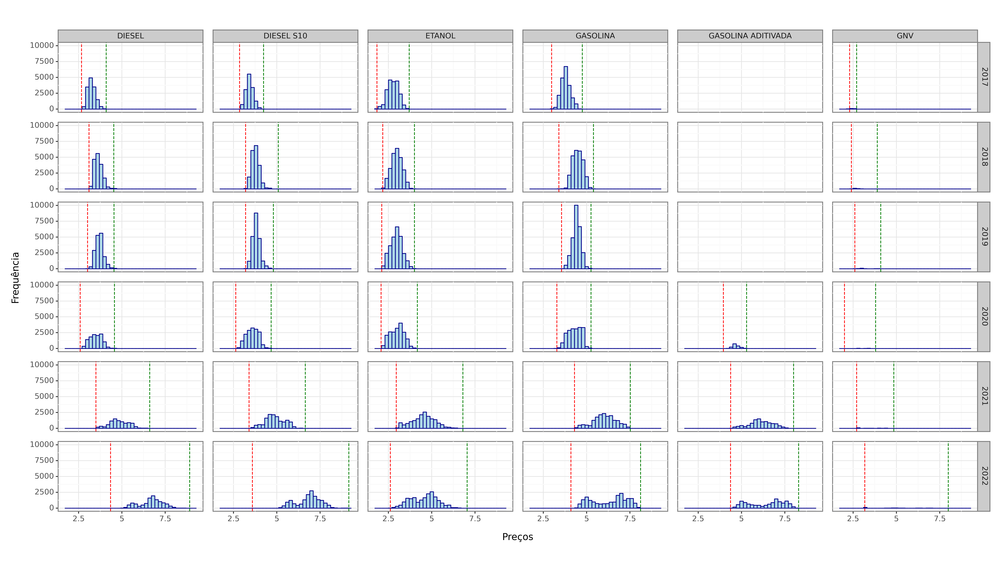

<Figure Size: (4480 x 2520)>

In [210]:
centro_oeste_df = precos_df.loc[precos_df['regiao_sigla'] == 'CO']

# criar a coluna ano para agrupamento dos dados da distribuição anual
centro_oeste_df = centro_oeste_df.assign(ano=centro_oeste_df['data'].apply(lambda x: x.year))

centro_oeste_ano_produto=centro_oeste_df.groupby(['ano', 'produto'], as_index=False)\
    .agg(preco_medio=('valor_de_venda',np.mean),
         preco_mediana=('valor_de_venda', np.median),
         preco_minimo=('valor_de_venda', np.min),
        preco_maximo=('valor_de_venda', np.max),)

# gráfico
(
    ggplot(centro_oeste_df, aes(x='valor_de_venda'))
    +geom_histogram(binwidth=.2, color="darkblue", fill="lightblue")
    +facet_grid('ano~produto')
    +theme_bw()
    +theme(dpi=280, figure_size=(16,9), axis_title_y=element_text(text='Frequência'), axis_title_x=element_text(text='Preços'), strip_background = element_rect(fill="#CCCCCC"))
    +geom_vline(data=centro_oeste_ano_produto, mapping=aes(xintercept='preco_minimo'), color='red', linetype='dashed')
    +geom_vline(data=centro_oeste_ano_produto, mapping=aes(xintercept='preco_maximo'), color='green', linetype='dashed')
)

Constatações: No geral os combustíveis nos 3 primeiros anos de 2017 a 2019 se concentraram em um valor médio, com altas frequências médias se comparadas às de valores mínimo e máximo, já durante os 3 últimos de 2020 a 2022, os valores além de variarem muito tiveram aumentos consideráveis.

- **Região Sudeste**

In [211]:
df=precos_df.assign(ano=lambda x: x.data.dt.year)
pd.set_option('display.float_format', lambda x: '%.4f' % x)

sudeste_df = df.loc[df['regiao_sigla'] == 'SE']
sudeste_df.describe()[['valor_de_venda']]

,valor_de_venda
count,2523012.0000
mean,4.1971
min,1.6990
25%,3.2890
50%,3.8780
75%,4.8800
max,9.6500
std,1.2868


In [212]:
sudeste_por_ano_por_produto=sudeste_df.groupby(['ano', 'produto'], as_index=False)\
    .agg(preco_medio=('valor_de_venda',np.mean),
         preco_mediana=('valor_de_venda', np.median),
         preco_minimo=('valor_de_venda', np.min),
        preco_maximo=('valor_de_venda', np.max),)

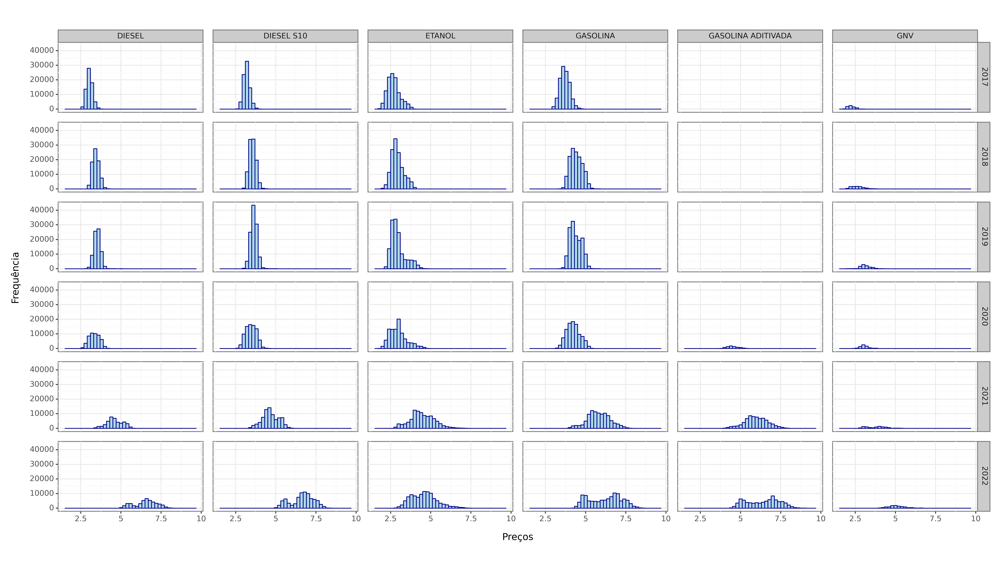

<Figure Size: (4480 x 2520)>

In [213]:
(
    ggplot(sudeste_df, aes(x='valor_de_venda'))
    +geom_histogram(binwidth=.2, color='darkblue', fill='lightblue')
    +facet_grid('ano~produto')
    +theme_bw()
    +theme(dpi=280, figure_size=(16,9), axis_title_y=element_text(text='Frequência'), axis_title_x=element_text(text='Preços'))
    # +geom_vline(data=sudeste_por_ano_por_produto, mapping=aes(xintercept='preco_medio'), color='purple')
    # +geom_vline(data=sudeste_por_ano_por_produto, mapping=aes(xintercept='preco_mediana'), color='lightgreen')
    # +geom_vline(data=sudeste_por_ano_por_produto, mapping=aes(xintercept='preco_minimo'), color='red', linetype='dashed')
    # +geom_vline(data=sudeste_por_ano_por_produto, mapping=aes(xintercept='preco_maximo'), color='green', linetype='dashed')
)

Nos gráficos acima, vemos que as distribuições vêm se deslocando para a direita, indicando um aumento de preços ao logo do período analisado. Além disso, podemos perceber uma maior amplitude dos preços (preço max. - preço min.).

- **Região Sul**

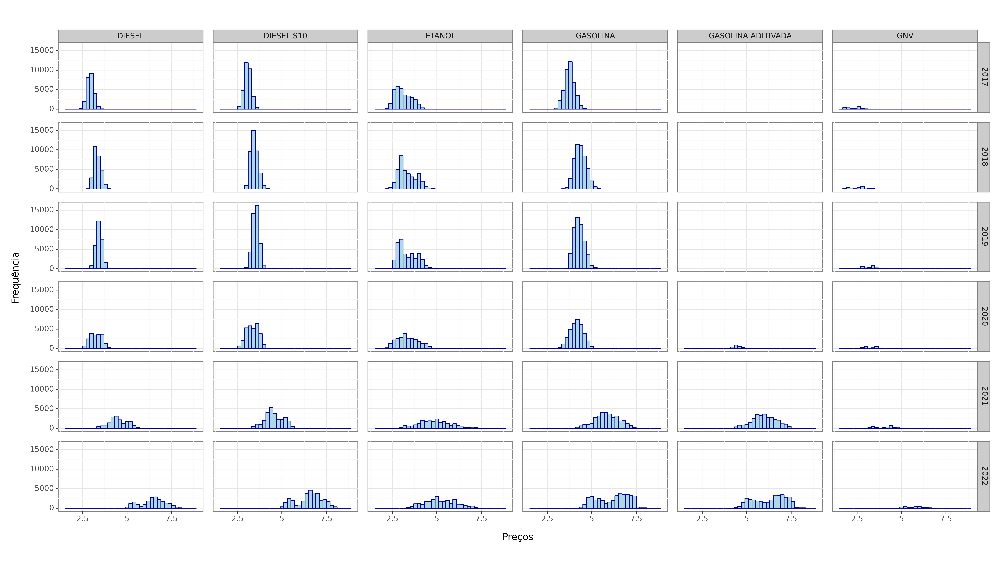

<Figure Size: (4480 x 2520)>

In [214]:
sul_df = precos_df.loc[precos_df['regiao_sigla'] == 'S']
sul_df=sul_df.assign(ano=lambda x: x.data.dt.year)
sul_df['valor_de_venda'].describe()

sul_por_ano_por_produto=sul_df.groupby(['ano', 'produto'], as_index=False)\
    .agg(preco_medio=('valor_de_venda',np.mean),
         preco_mediana=('valor_de_venda', np.median),
         preco_minimo=('valor_de_venda', np.min),
        preco_maximo=('valor_de_venda', np.max),)

(
    ggplot(sul_df, aes(x='valor_de_venda'))
    +geom_histogram(binwidth=.2, color='darkblue', fill='lightblue')
    +facet_grid('ano~produto')
    +theme_bw()
    +theme(dpi=280, figure_size=(16,9), axis_title_y=element_text(text='Frequência'), axis_title_x=element_text(text='Preços'))
)

Nos gráficos acima, vemos que as distribuições vêm se deslocando para a direita, indicando um aumento de preços ao logo do período analisado. Em especial o diesel em 2022 que, se observado, 
o preço mínimo praticado no período já é maior que o preço máximo nos anos anteriores a 2020.
Além disso, podemos perceber uma maior amplitude dos preços (preço max. - preço min.) nos últimos 2 anos.

- **Região Norte**

In [215]:
df_mari = precos_df.loc[precos_df['regiao_sigla'] == 'N']
df_mari = df_mari.assign(ano=df_mari['data'].apply(lambda x: x.year))
norte_df = df_mari

In [216]:
norte_por_ano_por_produto = norte_df.groupby(['ano', 'produto'], as_index=False)\
    .agg(preco_medio=('valor_de_venda',np.mean),
         preco_mediana=('valor_de_venda', np.median),
         preco_minimo=('valor_de_venda', np.min),
        preco_maximo=('valor_de_venda', np.max),)

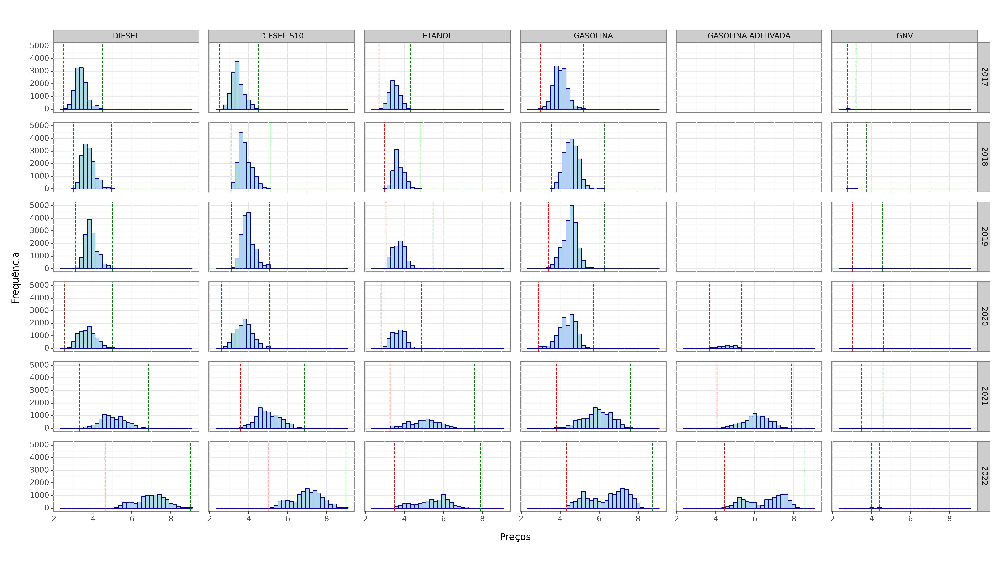

<Figure Size: (4480 x 2520)>

In [217]:
(
    ggplot(norte_df, aes(x='valor_de_venda'))
    +geom_histogram(binwidth=.2, color="darkblue", fill="lightblue")
    +facet_grid('ano~produto')
    +theme_bw()
    +theme(dpi=280, figure_size=(16,9), axis_title_y=element_text(text='Frequência'), axis_title_x=element_text(text='Preços'), strip_background = element_rect(fill="#CCCCCC"))
    +geom_vline(data=norte_por_ano_por_produto, mapping=aes(xintercept='preco_minimo'), color='red', linetype='dashed')
    +geom_vline(data=norte_por_ano_por_produto, mapping=aes(xintercept='preco_maximo'), color='green', linetype='dashed')
)

- **Região Nordeste**

In [218]:
df_pedro = precos_df.loc[precos_df['regiao_sigla'] == 'NE']
df_pedro = df_pedro.assign(ano=df_pedro['data'].apply(lambda x: x.year))
nordeste_df = df_pedro

In [219]:
nordeste_por_ano_por_produto = nordeste_df.groupby(['ano', 'produto'], as_index=False)\
    .agg(preco_medio=('valor_de_venda',np.mean),
         preco_mediana=('valor_de_venda', np.median),
         preco_minimo=('valor_de_venda', np.min),
        preco_maximo=('valor_de_venda', np.max),)

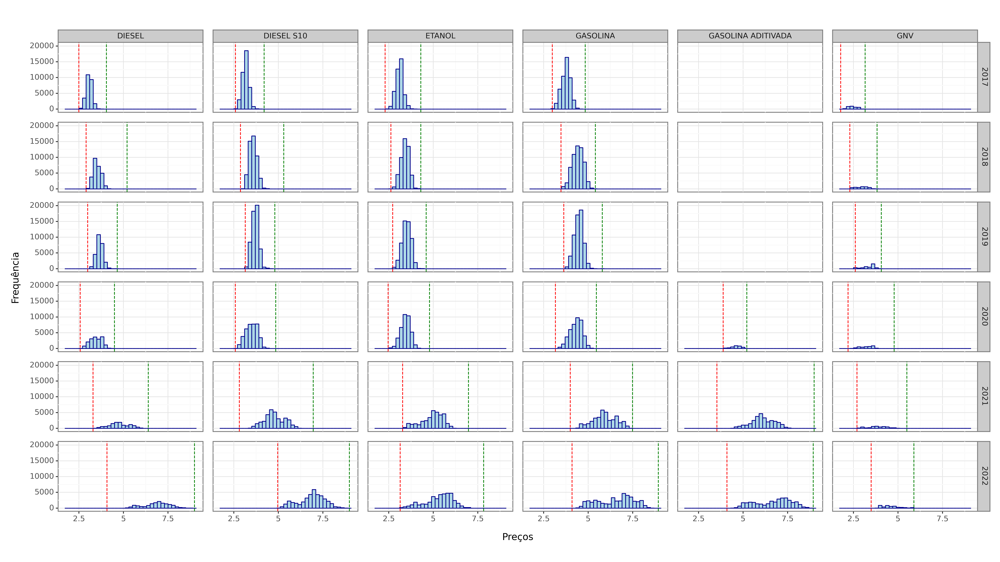

<Figure Size: (4480 x 2520)>

In [220]:
(
    ggplot(nordeste_df, aes(x='valor_de_venda'))
    +geom_histogram(binwidth=.2, color="darkblue", fill="lightblue")
    +facet_grid('ano~produto')
    +theme_bw()
    +theme(dpi=280, figure_size=(16,9), axis_title_y=element_text(text='Frequência'), axis_title_x=element_text(text='Preços'), strip_background = element_rect(fill="#CCCCCC"))
    +geom_vline(data=nordeste_por_ano_por_produto, mapping=aes(xintercept='preco_minimo'), color='red', linetype='dashed')
    +geom_vline(data=nordeste_por_ano_por_produto, mapping=aes(xintercept='preco_maximo'), color='green', linetype='dashed')
)

Nos gráficos acima, vemos que as distribuições vêm se deslocando para a direita, indicando um aumento de preços ao logo do período analisado. Além disso, podemos perceber uma maior amplitude dos preços (preço max. - preço min.).

**4.2 - Referente às bandeiras de postos, o mercado é pulverizado ou concentrado? (Análise por anos e regiões)**

- **Região Centro-Oeste**

In [221]:
# agrupamento por ano, bandeira e cnpj para obter a frequência absoluta de cada grupo
co_freq_df=centro_oeste_df.drop_duplicates(subset=['cnpj_da_revenda', 'ano', 'bandeira']).sort_values(['cnpj_da_revenda', 'ano'])\
    .groupby(['bandeira', 'ano'], as_index=False)\
    .agg(freq_abs=('cnpj_da_revenda', 'count'))

In [222]:
co_freq_df['total'] = co_freq_df.groupby('ano')['freq_abs'].transform(lambda x: x.sum())
co_freq_df['freq_rel'] = (co_freq_df['freq_abs'] / co_freq_df['total'])*100
co_freq_df.sort_values(['ano', 'freq_rel'], ascending=[True, False],inplace=True)

# definição das bandeiras princiapis (com soma cumulativa da frequência relativa de até 95%)
co_freq_df['cumsum'] = co_freq_df.groupby('ano')['freq_rel'].cumsum()
co_bandeiras_ano_95=co_freq_df.loc[(co_freq_df.groupby('ano')['freq_rel'].cumsum() <= 95)]

co_bandeiras_ano_95

,bandeira,ano,freq_abs,total,freq_rel,cumsum
11,BRANCA,2017,405,1188,34.0909,34.0909
46,PETROBRAS DISTRIBUIDORA S.A.,2017,378,1188,31.8182,65.9091
32,IPIRANGA,2017,149,1188,12.5421,78.4512
59,RAIZEN,2017,138,1188,11.6162,90.0673
2,ALESAT,2017,29,1188,2.4411,92.5084
91,TAURUS,2017,22,1188,1.8519,94.3603
12,BRANCA,2018,584,1425,40.9825,40.9825
47,PETROBRAS DISTRIBUIDORA S.A.,2018,376,1425,26.3860,67.3684
60,RAIZEN,2018,174,1425,12.2105,79.5789
33,IPIRANGA,2018,173,1425,12.1404,91.7193


In [223]:
co_bandeiras=sorted(co_bandeiras_ano_95['bandeira'].unique())
co_bandeiras

['ALESAT',
 'BRANCA',
 'IPIRANGA',
 'PETROBRAS DISTRIBUIDORA S.A.',
 'RAIZEN',
 'TAURUS',
 'VIBRA ENERGIA']

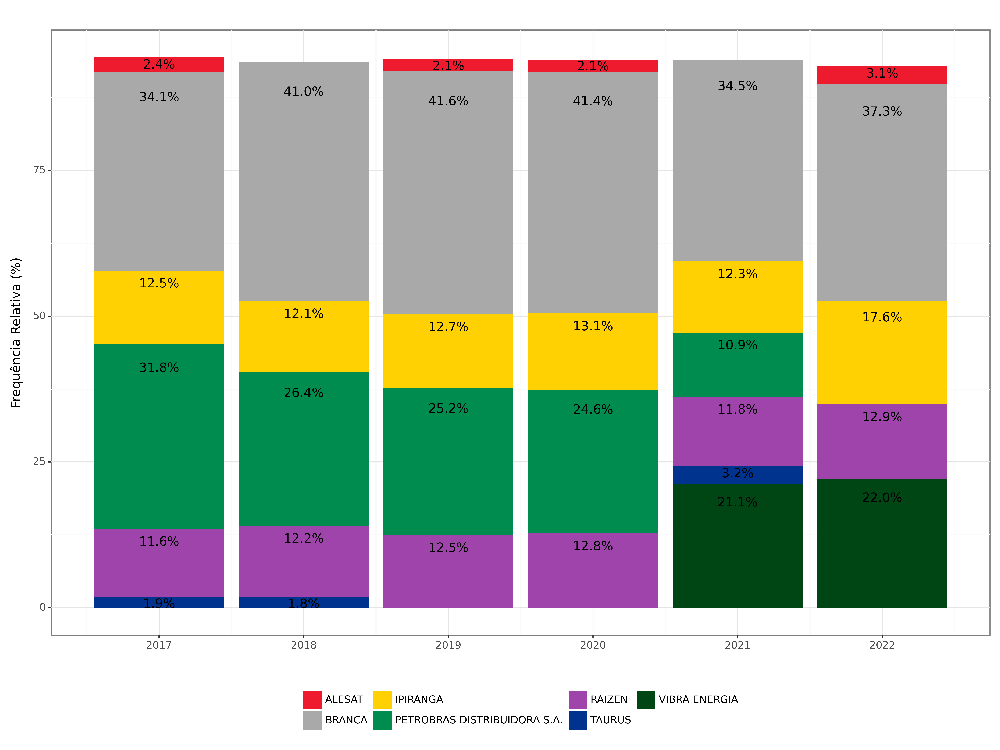

<Figure Size: (3360 x 2520)>

In [224]:
# cores de cada bandeira 
co_cores=['#ED1B2D','darkgrey', '#FFD002', '#008C4F', '#9F44AA', '#00338E', '#004514']
co_cores_bandeiras=dict(zip(co_bandeiras, co_cores))

# gráfico
(
    ggplot(co_bandeiras_ano_95, aes(x='ano', y='freq_rel', group='bandeira', fill='bandeira'))
    +geom_bar(stat='identity', position='stack')
    +labs(y='Frequência Relativa (%)', x='')
    +theme_bw()
    +theme(legend_title=element_blank(), legend_position='bottom', figure_size=(12,9), dpi=280)
    +scale_x_continuous(breaks=list(range(2017, 2023)))
    +scale_fill_manual(co_cores_bandeiras)
    +geom_text(mapping=aes(label='freq_rel'), format_string='{:.1f}%', va='top',  position = position_stack(vjust = .9))
)

- **Região Sudeste**

In [225]:
# Impossibilitando a contagem duplicada de bandeiras

bandeiras_se_por_ano=sudeste_df.drop_duplicates(subset=['cnpj_da_revenda', 'ano', 'bandeira']).sort_values(['cnpj_da_revenda', 'ano'])\
    .groupby(['bandeira', 'ano'], as_index=False)\
    .agg(contagem=('cnpj_da_revenda', 'count'))

In [226]:
bandeiras_se_por_ano['freq_rel'] = bandeiras_se_por_ano['contagem'] / bandeiras_se_por_ano.groupby('ano')['contagem']\
    .transform(lambda x: x.sum())*100
bandeiras_se_por_ano.sort_values(['ano', 'freq_rel'], ascending=[True, False],inplace=True)

In [227]:
# Verificando as bandeiras que somam, por ano, juntas, até 97% dos estabelecimentos que tiveram seus preços coletados.
bandeiras_se_por_ano_95=bandeiras_se_por_ano.loc[(bandeiras_se_por_ano.groupby('ano')['freq_rel'].cumsum() <= 97)]

In [228]:
bandeiras_unicas=bandeiras_se_por_ano_95['bandeira'].unique()
bandeiras_se_por_ano['bandeira']=bandeiras_se_por_ano['bandeira'].apply(lambda x: x if x in bandeiras_unicas else 'OUTROS')

# O conteúdo abaixo é o mesmo que duas células acima. É necessário rodá-lo para funcionar a criação correta do grupo 'OUTROS'

bandeiras_se_por_ano['freq_rel'] = bandeiras_se_por_ano['contagem'] / bandeiras_se_por_ano.groupby('ano')['contagem']\
    .transform(lambda x: x.sum())*100
bandeiras_se_por_ano.sort_values(['ano', 'freq_rel'], ascending=[True, False],inplace=True)

In [229]:
bandeiras_se_por_ano=bandeiras_se_por_ano.groupby(['bandeira', 'ano'])[['freq_rel']].sum()\
    .reset_index()\
    .sort_values(['ano', 'freq_rel'], ascending=[True, False])

In [230]:
bandeiras_se_por_ano.head()

,bandeira,ano,freq_rel
0,BRANCA,2017,32.4321
18,PETROBRAS DISTRIBUIDORA S.A.,2017,22.2893
23,RAIZEN,2017,20.4365
6,IPIRANGA,2017,18.5012
12,OUTROS,2017,6.3409


In [231]:
bandeiras=sorted(bandeiras_se_por_ano_95['bandeira'].unique())
cores=['darkgrey', '#FFD002', '#008C4F', '#9F44AA', '#004514']
cores_bandeiras=dict(zip(bandeiras, cores))
cores_bandeiras.update({'OUTROS': '#707070'})

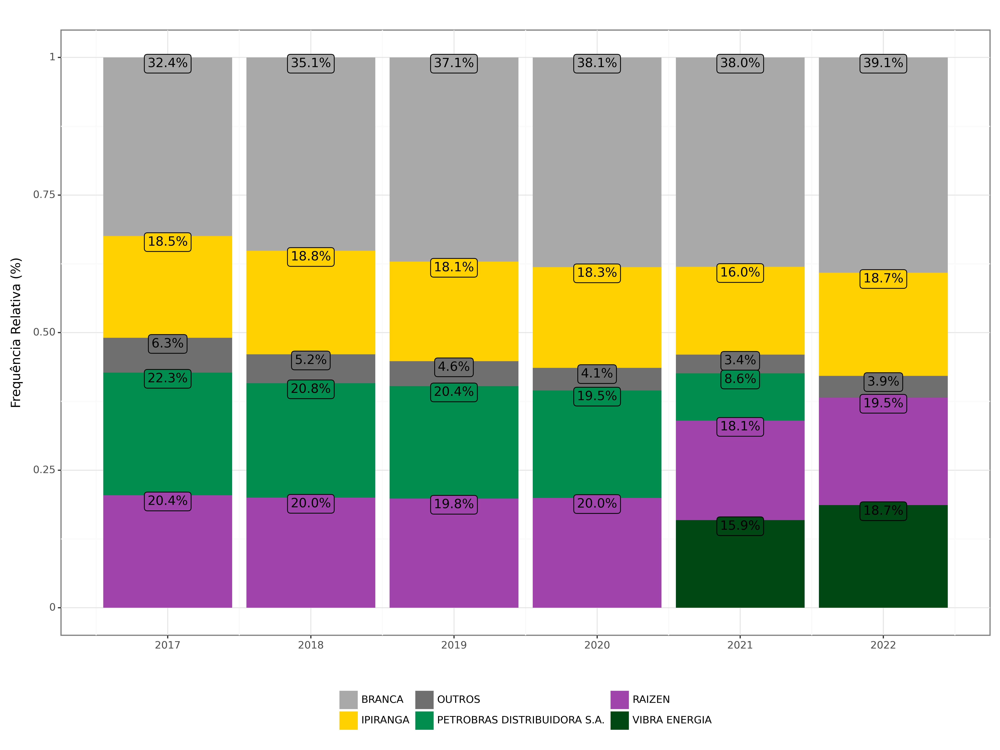

<Figure Size: (3360 x 2520)>

In [232]:
(
    ggplot(bandeiras_se_por_ano, aes(x='ano', group='bandeira', fill='bandeira'))
    +geom_bar(position='fill', mapping=aes(y='freq_rel'), stat='identity')
    +labs(y='Frequência Relativa (%)', x='')
    +theme_bw()
    +theme(legend_title=element_blank(), legend_position='bottom', figure_size=(12,9), dpi=280)
    +scale_x_continuous(breaks=list(range(2017, 2023)))
    +scale_fill_manual(cores_bandeiras)
    # +geom_text(mapping=aes(y='freq_rel',label='freq_rel'), format_string='{:.1f}%', va='top', position='fill', size=10)
    +geom_label(mapping=aes(y='freq_rel',label='freq_rel'), position='fill', format_string='{:.1f}%', va='top', show_legend=False)
)

No gráfico acima, vemos que o mercado de bandeiras de postos de combustíveis no sudeste é altamente concentrado. Três bandeiras concentram mais da metade dos postos que tiveram seus preços coletados. Além disso, vale destacar que Petrobras Distribuidora S.A., em 2021, teve diminuição em sua representatividade devido à [venda de sua parte acionária da Vibra Energia][1], sendo aquele ano de transição. Em 2022, é concluída a transação e a Vibra Energia passa a representar o que antes era Petrobras Distribuidora S.A..

[1]:https://g1.globo.com/economia/negocios/noticia/2021/08/19/br-distribuidora-passa-a-se-chamar-vibra-energiapostos-manterao-simbolo-br.ghtml

- **Região Sul**

In [233]:
# Impossibilitando a contagem duplicada de bandeiras

bandeiras_s_por_ano=sul_df.drop_duplicates(subset=['cnpj_da_revenda', 'ano', 'bandeira']).sort_values(['cnpj_da_revenda', 'ano'])\
    .groupby(['bandeira', 'ano'], as_index=False)\
    .agg(contagem=('cnpj_da_revenda', 'count'))

bandeiras_s_por_ano['freq_rel'] = bandeiras_s_por_ano['contagem'] / bandeiras_s_por_ano.groupby('ano')['contagem']\
    .transform(lambda x: x.sum())*100
bandeiras_s_por_ano.sort_values(['ano', 'freq_rel'], ascending=[True, False],inplace=True)

# Verificando as bandeiras que somam, por ano, juntas, até 97% dos estabelecimentos que tiveram seus preços coletados.
bandeiras_s_por_ano_95=bandeiras_s_por_ano.loc[(bandeiras_s_por_ano.groupby('ano')['freq_rel'].cumsum() <= 95)]

bandeiras_unicas_s=bandeiras_s_por_ano_95['bandeira'].unique()
bandeiras_s_por_ano['bandeira']=bandeiras_s_por_ano['bandeira'].apply(lambda x: x if x in bandeiras_unicas_s else 'OUTROS')

# O conteúdo abaixo é o mesmo que duas células acima. É necessário rodá-lo para funcionar a criação correta do grupo 'OUTROS'
bandeiras_s_por_ano['freq_rel'] = bandeiras_s_por_ano['contagem'] / bandeiras_s_por_ano.groupby('ano')['contagem']\
    .transform(lambda x: x.sum())*100
bandeiras_s_por_ano.sort_values(['ano', 'freq_rel'], ascending=[True, False],inplace=True)


bandeiras_s_por_ano=bandeiras_s_por_ano.groupby(['bandeira', 'ano'])[['freq_rel']].sum()\
    .reset_index()\
    .sort_values(['ano', 'freq_rel'], ascending=[True, False])

bandeiras_s_por_ano.head()

,bandeira,ano,freq_rel
18,IPIRANGA,2017,29.1683
6,BRANCA,2017,23.9052
30,PETROBRAS DISTRIBUIDORA S.A.,2017,20.9723
35,RAIZEN,2017,15.3475
24,OUTROS,2017,4.2186


In [234]:
bandeiras_s=sorted(bandeiras_s_por_ano_95['bandeira'].unique())
bandeiras_s

['ALESAT',
 'BRANCA',
 'CHARRUA',
 'IPIRANGA',
 'PETROBRAS DISTRIBUIDORA S.A.',
 'RAIZEN',
 'RAIZEN MIME',
 'RODOIL',
 'STANG',
 'VIBRA ENERGIA']

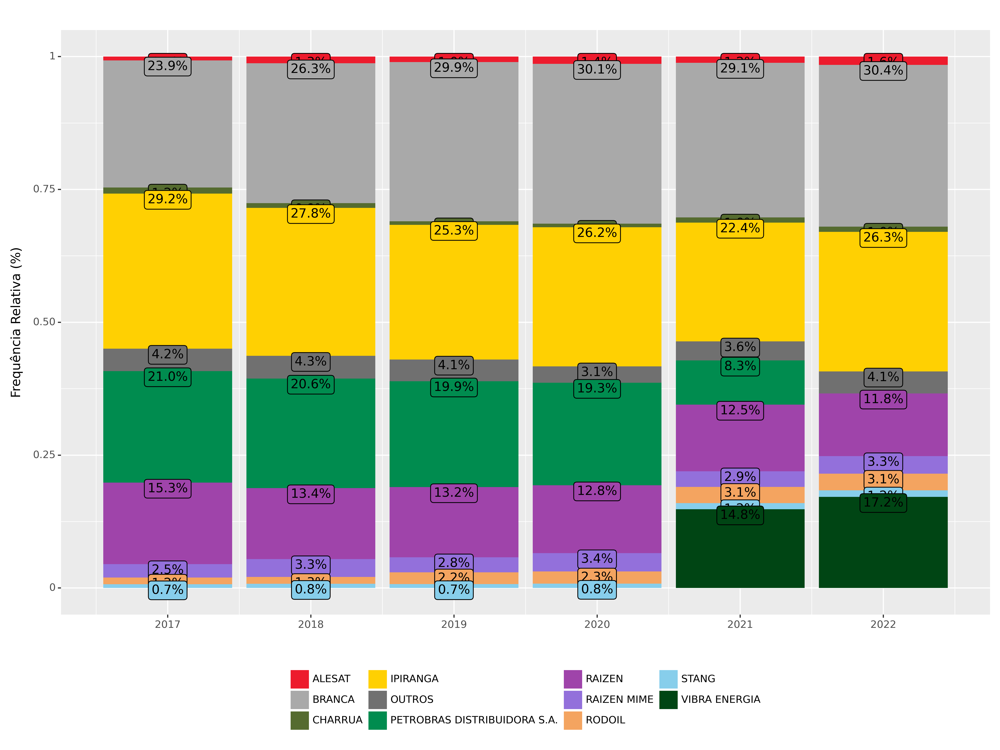

<Figure Size: (3360 x 2520)>

In [235]:
cores_s=['#ED1B2D','darkgrey', '#556B2F' ,'#FFD002', '#008C4F', '#9F44AA','#9370DB','#F4A460', '#87CEEB', '#004514']
cores_bandeiras_s=dict(zip(bandeiras_s, cores_s))
cores_bandeiras_s.update({'OUTROS': '#707070'})

(
    ggplot(bandeiras_s_por_ano, aes(x='ano', group='bandeira', fill='bandeira'))
    +geom_bar(position='fill', mapping=aes(y='freq_rel'), stat='identity')
    +labs(y='Frequência Relativa (%)', x='')
    +theme(legend_title=element_blank(), legend_position='bottom', figure_size=(12,9), dpi=280)
    +scale_x_continuous(breaks=list(range(2017, 2023)))
    +scale_fill_manual(cores_bandeiras_s)
    # +geom_text(mapping=aes(y='freq_rel',label='freq_rel'), format_string='{:.1f}%', va='top', position='fill', size=10)
    +geom_label(mapping=aes(y='freq_rel',label='freq_rel'), position='fill', format_string='{:.1f}%', va='top', show_legend=False)
)

No gráfico acima, vemos que o mercado de bandeiras de postos de combustíveis no sudeste é parcialmente pulverizado. apesar de três bandeiras concentrarem mais da metade dos postos que tiveram seus preços coletados, temos uma certa pulverização quando analisamos os outros 50%. Isso acontece porque nossa margem de análise é de 95% e, para atender a essa margem, temos uma pulverização maior nos últimos 10% de representatividade.

- **Região Norte**

In [236]:
bandeiras_n_por_ano=norte_df.drop_duplicates(subset=['cnpj_da_revenda', 'ano','bandeira']).sort_values(['cnpj_da_revenda', 'ano'])\
    .groupby(['bandeira', 'ano'], as_index=False)\
    .agg(contagem=('cnpj_da_revenda', 'count'))

bandeiras_n_por_ano

,bandeira,ano,contagem
0,ALE COMBUSTÍVEIS,2017,2
1,ALE COMBUSTÍVEIS,2018,1
2,ALESAT,2017,6
3,ALESAT,2018,9
4,ALESAT,2019,6
...,...,...,...
71,SP,2022,2
72,SUPERGASBRAS ENERGIA,2022,4
73,ULTRAGAZ,2022,1
74,VIBRA ENERGIA,2021,216


In [237]:
bandeiras_n_por_ano['freq_rel'] = bandeiras_n_por_ano['contagem'] / bandeiras_n_por_ano.groupby('ano')['contagem']\
    .transform(lambda x: x.sum())*100
bandeiras_n_por_ano.sort_values(['ano', 'freq_rel'], ascending=[True, False],inplace=True)

bandeiras_n_por_ano['cumsum'] = bandeiras_n_por_ano.groupby('ano')['freq_rel'].cumsum()
bandeiras_n_por_ano_95=bandeiras_n_por_ano.loc[(bandeiras_n_por_ano.groupby('ano')['freq_rel'].cumsum() <= 97)]
bandeiras_n_por_ano

,bandeira,ano,contagem,freq_rel,cumsum
38,PETROBRAS DISTRIBUIDORA S.A.,2017,260,28.0172,28.0172
16,BRANCA,2017,200,21.5517,49.5690
30,IPIRANGA,2017,169,18.2112,67.7802
55,SABBÁ,2017,101,10.8836,78.6638
9,ATEM' S,2017,89,9.5905,88.2543
...,...,...,...,...,...
8,AMAZONGÁS,2022,2,0.1916,99.4253
54,RZD DISTRIBUIDORA,2022,2,0.1916,99.6169
71,SP,2022,2,0.1916,99.8084
65,SIMARELLI,2022,1,0.0958,99.9042


In [238]:
bandeiras_n=sorted(bandeiras_n_por_ano_95['bandeira'].unique())
bandeiras_n

["ATEM' S",
 'BRANCA',
 'EQUADOR',
 'IPIRANGA',
 'PETROBRAS DISTRIBUIDORA S.A.',
 'RAIZEN',
 'SABBÁ',
 'VIBRA ENERGIA']

In [239]:

cores_n=['#DAA520','darkgrey','#007FB9','#FFD002','#008C4F', '#9F44AA','#800000','#004514']
cores_bandeiras_n=dict(zip(bandeiras_n, cores_n))

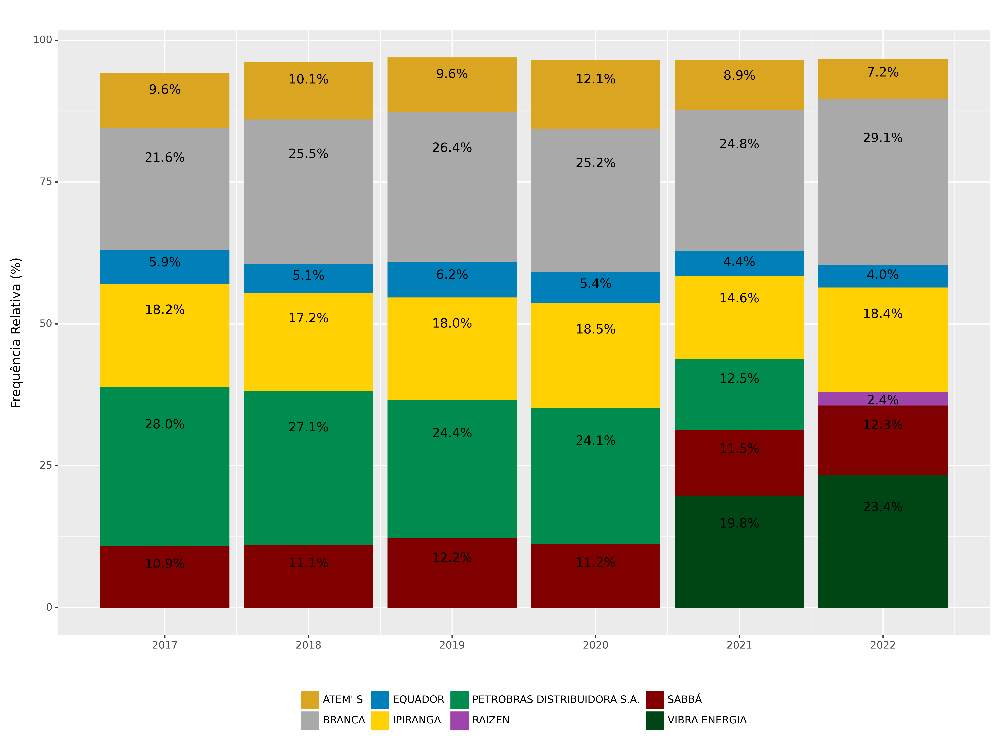

<Figure Size: (3360 x 2520)>

In [240]:
(
    ggplot(bandeiras_n_por_ano_95, aes(x='ano', y='freq_rel', group='bandeira', fill='bandeira'))
    +geom_bar(stat='identity', position='stack')
    +labs(y='Frequência Relativa (%)', x='')
    +theme(legend_title=element_blank(), legend_position='bottom', figure_size=(12,9), dpi=280)
    +scale_x_continuous(breaks=list(range(2017, 2023)))
    +scale_fill_manual(cores_bandeiras_n)
    +geom_text(mapping=aes(label='freq_rel'), format_string='{:.1f}%', va='top', position = position_stack(vjust = .8))
)

- **Região Nordeste**

In [241]:
bandeiras_ne_por_ano=nordeste_df.drop_duplicates(subset=['cnpj_da_revenda', 'ano','bandeira']).sort_values(['cnpj_da_revenda', 'ano'])\
    .groupby(['bandeira', 'ano'], as_index=False)\
    .agg(contagem=('cnpj_da_revenda', 'count'))

bandeiras_ne_por_ano

,bandeira,ano,contagem
0,ALE COMBUSTÍVEIS,2017,7
1,ALE COMBUSTÍVEIS,2018,7
2,ALESAT,2017,109
3,ALESAT,2018,111
4,ALESAT,2019,104
...,...,...,...
117,TEMAPE,2021,7
118,TEMAPE,2022,10
119,TORRAO,2017,3
120,VIBRA ENERGIA,2021,662


In [242]:
bandeiras_ne_por_ano['freq_rel'] = bandeiras_ne_por_ano['contagem'] / bandeiras_ne_por_ano.groupby('ano')['contagem']\
    .transform(lambda x: x.sum())*100
bandeiras_ne_por_ano.sort_values(['ano', 'freq_rel'], ascending=[True, False],inplace=True)
bandeiras_ne_por_ano

,bandeira,ano,contagem,freq_rel
8,BRANCA,2017,818,29.6377
59,PETROBRAS DISTRIBUIDORA S.A.,2017,811,29.3841
79,RAIZEN,2017,420,15.2174
39,IPIRANGA,2017,283,10.2536
2,ALESAT,2017,109,3.9493
...,...,...,...,...
70,PETROSERRA,2022,7,0.2444
34,FEDERAL ENERGIA,2022,5,0.1746
50,LARCO,2022,5,0.1746
52,NACIONAL GÁS BUTANO,2022,1,0.0349


In [243]:
bandeiras_ne_por_ano['cumsum'] = bandeiras_ne_por_ano.groupby('ano')['freq_rel'].cumsum()
bandeiras_ne_por_ano_95=bandeiras_ne_por_ano.loc[(bandeiras_ne_por_ano.groupby('ano')['freq_rel'].cumsum() <= 95)]

In [244]:
bandeiras_ne=sorted(bandeiras_ne_por_ano_95['bandeira'].unique())
bandeiras_ne

['ALESAT',
 'BRANCA',
 'DISLUB',
 'IPIRANGA',
 'PETROBRAS DISTRIBUIDORA S.A.',
 'RAIZEN',
 'SABBÁ',
 'SP',
 'VIBRA ENERGIA']

In [245]:
cores_ne=['#ED1B2D','darkgrey', '#0000CD','#FFD002', '#008C4F', '#9F44AA', '#800000', '#B8860B', '#004514']
cores_bandeiras_ne=dict(zip(bandeiras_ne, cores_ne))

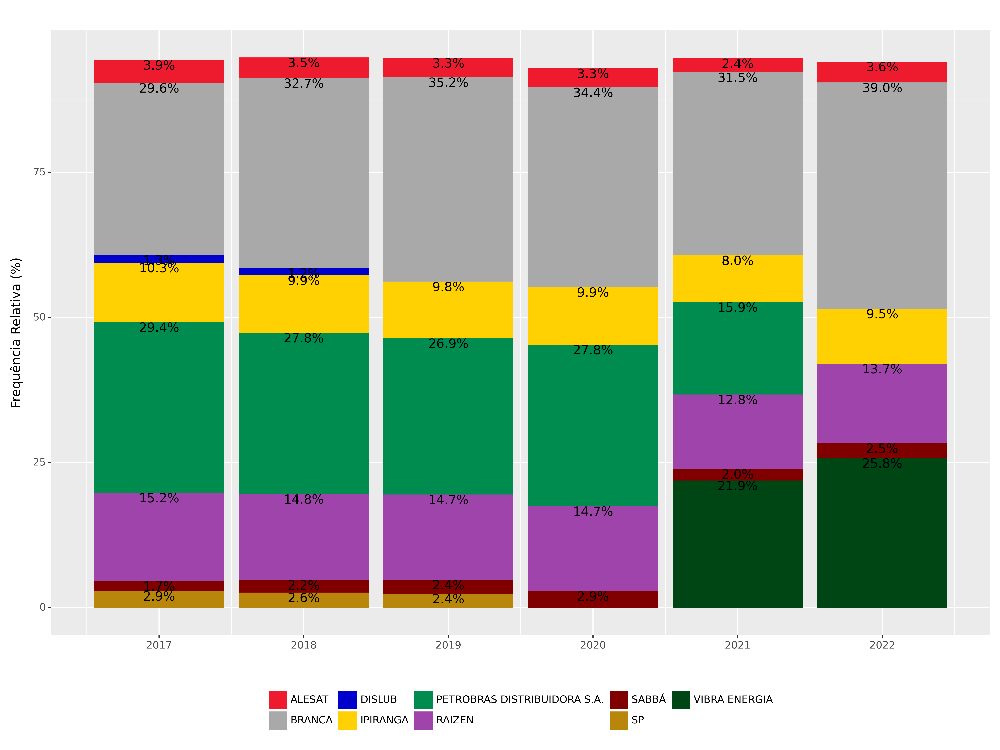

<Figure Size: (3360 x 2520)>

In [246]:
(
    ggplot(bandeiras_ne_por_ano_95, aes(x='ano', y='freq_rel', group='bandeira', fill='bandeira'))
    +geom_bar(stat='identity', position='stack')
    +labs(y='Frequência Relativa (%)', x='')
    +theme(legend_title=element_blank(), legend_position='bottom', figure_size=(12,9), dpi=280)
    +scale_x_continuous(breaks=list(range(2017, 2023)))
    +scale_fill_manual(cores_bandeiras_ne)
    +geom_text(mapping=aes(label='freq_rel'), format_string='{:.1f}%', va='top', position='stack')
)

**4.3 - Considerando as principais bandeiras identificadas, como foi o comportamento dos preços de cada uma delas? (Análise por anos e regiões)**

- **Região Centro-Oeste**

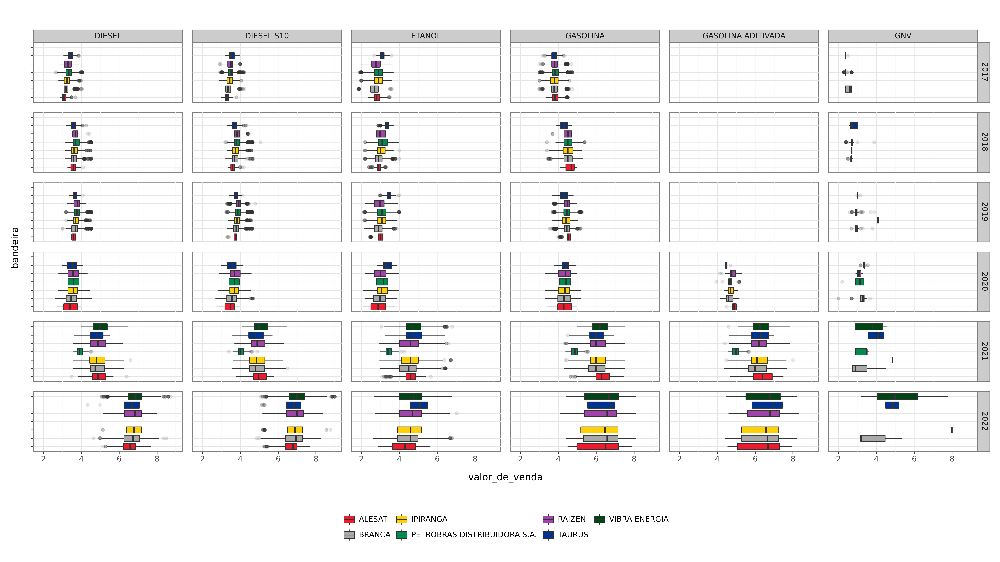

<Figure Size: (4480 x 2520)>

In [247]:
co_b = centro_oeste_df.loc[centro_oeste_df['bandeira'].isin(co_bandeiras_ano_95['bandeira'].unique())].copy()
co_b.sort_values(['bandeira','produto','data'], inplace=True)

(
    ggplot(co_b,aes(x='bandeira', y='valor_de_venda'))
    +facet_grid('ano~produto')
    +geom_boxplot(outlier_alpha=1/10, mapping=aes(fill='bandeira'))
    +theme_bw()
    +theme(figure_size=(16,9), 
       dpi=280,
       legend_title=element_blank(),
       legend_position="bottom",
       legend_key=element_blank(),
       axis_text_y=element_blank()
      )
    +scale_fill_manual(co_cores_bandeiras)
    +coord_flip()
 )

- **Região Sudeste**

In [248]:
sudeste_df.head()

,regiao_sigla,estado_sigla,cnpj_da_revenda,produto,data,valor_de_venda,bandeira,ano
0,SE,SP,49.051.667/0001-02,GASOLINA,2017-01-03,3.6990,PETROBRAS DISTRIBUIDORA S.A.,2017
1,SE,SP,49.051.667/0001-02,ETANOL,2017-01-03,2.8990,PETROBRAS DISTRIBUIDORA S.A.,2017
2,SE,SP,49.051.667/0001-02,DIESEL,2017-01-03,2.9590,PETROBRAS DISTRIBUIDORA S.A.,2017
3,SE,SP,49.051.667/0001-02,DIESEL S10,2017-01-03,3.0790,PETROBRAS DISTRIBUIDORA S.A.,2017
4,SE,SP,49.051.667/0001-02,GNV,2017-01-03,2.0990,PETROBRAS DISTRIBUIDORA S.A.,2017


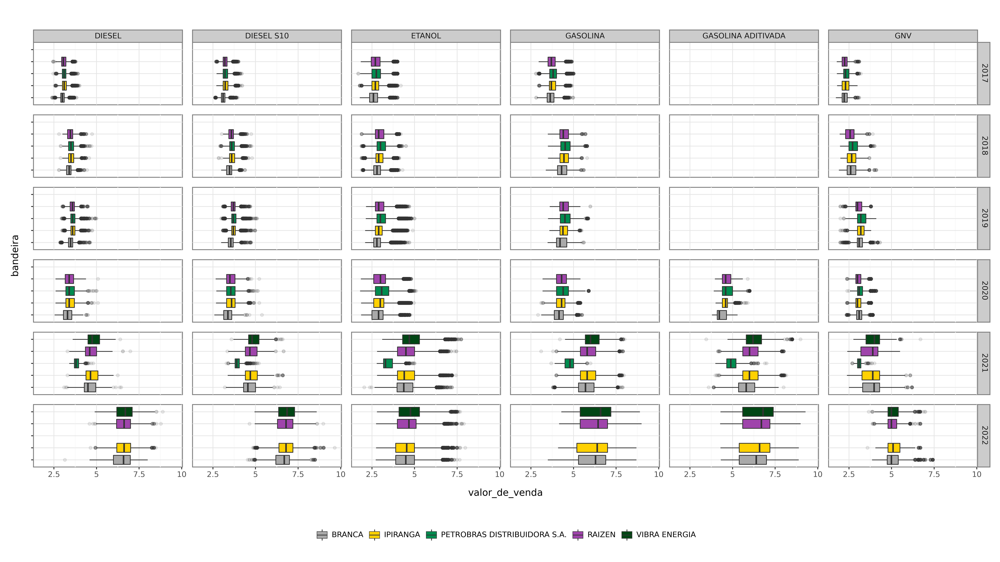

<Figure Size: (4480 x 2520)>

In [249]:
(
        ggplot(sudeste_df.loc[sudeste_df['bandeira'].isin(bandeiras_se_por_ano_95['bandeira'].unique())], aes(x='bandeira', y='valor_de_venda'))
        +geom_boxplot(outlier_alpha=1/10,mapping=aes(fill='bandeira'))
        +facet_grid('ano ~ produto')
        +theme_bw()
        +theme(figure_size=(16,9), 
               dpi=280,
               legend_title=element_blank(),
               legend_position="bottom",
               legend_key=element_blank(),
               axis_text_y=element_blank(),
              )
        +scale_fill_manual(cores_bandeiras)
        +coord_flip()
        )

- **Região Sul**

In [250]:
sul_df.head()

,regiao_sigla,estado_sigla,cnpj_da_revenda,produto,data,valor_de_venda,bandeira,ano
8,S,RS,88.587.589/0001-17,GASOLINA,2017-01-03,3.8490,BRANCA,2017
9,S,RS,88.587.589/0001-17,ETANOL,2017-01-03,3.4500,BRANCA,2017
10,S,RS,88.587.589/0001-17,GNV,2017-01-03,2.6990,BRANCA,2017
14,S,PR,79.854.667/0001-01,GASOLINA,2017-01-02,3.8600,RODOIL,2017
15,S,PR,79.854.667/0001-01,ETANOL,2017-01-02,2.9400,RODOIL,2017


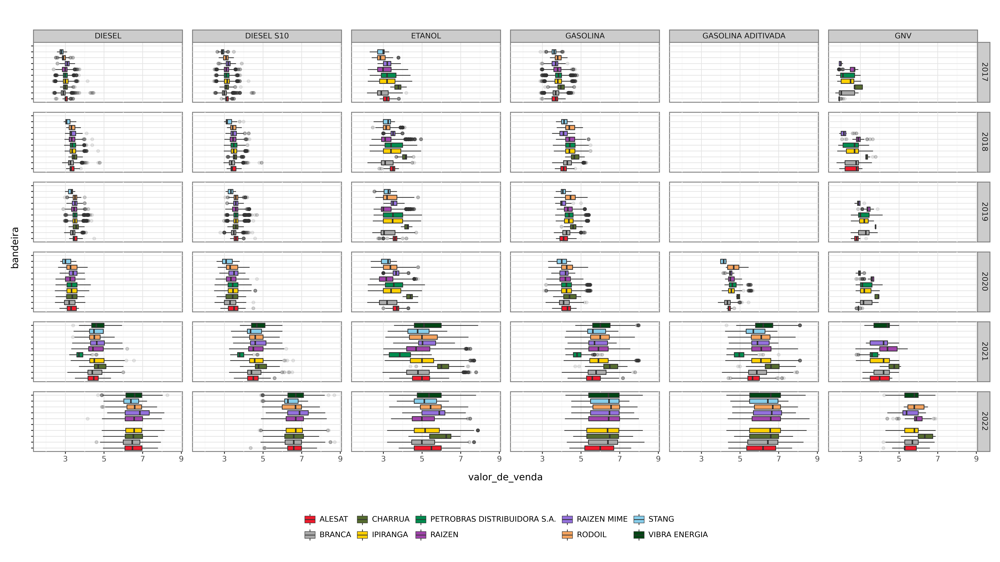

<Figure Size: (4480 x 2520)>

In [251]:
sul_b_df = sul_df.loc[sul_df['bandeira'].isin(bandeiras_s_por_ano_95['bandeira'].unique())].copy()
sul_b_df.sort_values(['bandeira','produto','data'], inplace=True)

(
    ggplot(sul_b_df,aes(x='bandeira', y='valor_de_venda'))
    +facet_grid('ano~produto')
    +geom_boxplot(outlier_alpha=1/10, mapping=aes(fill='bandeira'))
    +theme_bw()
    +theme(figure_size=(16,9), 
       dpi=280,
       legend_title=element_blank(),
       legend_position="bottom",
       legend_key=element_blank(),
       axis_text_y=element_blank()
      )
    +scale_fill_manual(cores_bandeiras_s)
    +coord_flip()
 )

Os preços entre Etanol, Diesel S10 e Diesel possuem um padrão entre os anos, o que mudou entre 2021 e 2022, com o preço do etanol sofrendo um leve deslocamento em relação aos outros combustíveis. Além disso, em 2021 e 2022 é possível observar que os picos mínimos e máximos set tornaram mais "distantes", ou seja, os preços estiveram mais oscilantes nesses períodos. Além disso, é possível observar que a gasolina se mantém como o combustível mais caro em todo o período e o GNV o mais barato.

- **Região Norte**

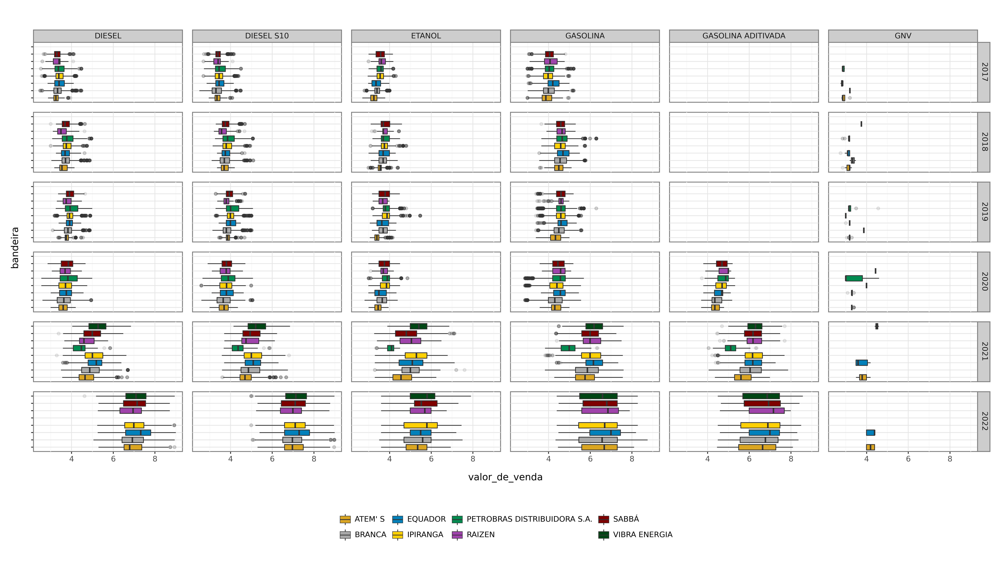

<Figure Size: (4480 x 2520)>

In [252]:
norte_b = norte_df.loc[norte_df['bandeira'].isin(bandeiras_n_por_ano_95['bandeira'].unique())].copy()
norte_b.sort_values(['bandeira','produto','data'], inplace=True)

(
    ggplot(norte_b,aes(x='bandeira', y='valor_de_venda'))
    +facet_grid('ano~produto')
    +geom_boxplot(outlier_alpha=1/10, mapping=aes(fill='bandeira'))
    +theme_bw()
    +theme(figure_size=(16,9), 
       dpi=280,
       legend_title=element_blank(),
       legend_position="bottom",
       legend_key=element_blank(),
       axis_text_y=element_blank()
      )
    +scale_fill_manual(cores_bandeiras_n)
    +coord_flip()
 )

- **Região Nordeste**

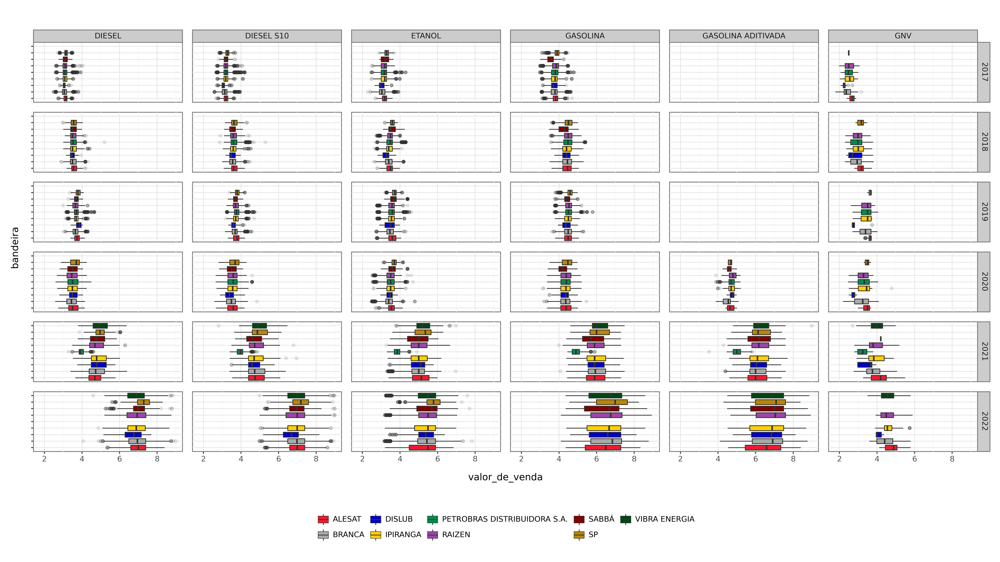

<Figure Size: (4480 x 2520)>

In [253]:
nordeste_b = nordeste_df.loc[nordeste_df['bandeira'].isin(bandeiras_ne_por_ano_95['bandeira'].unique())].copy()
nordeste_b.sort_values(['bandeira','produto','data'], inplace=True)

(
    ggplot(nordeste_b,aes(x='bandeira', y='valor_de_venda'))
    +facet_grid('ano~produto')
    +geom_boxplot(outlier_alpha=1/10, mapping=aes(fill='bandeira'))
    +theme_bw()
    +theme(figure_size=(16,9), 
       dpi=280,
       legend_title=element_blank(),
       legend_position="bottom",
       legend_key=element_blank(),
       axis_text_y=element_blank()
      )
    +scale_fill_manual(cores_bandeiras_ne)
    +coord_flip()
 )

**4.4 - A distribuição de preços dos combustíveis corresponde a uma distribuição normal? (Análise em 2022, por região)** 

- **Região Centro-Oeste**

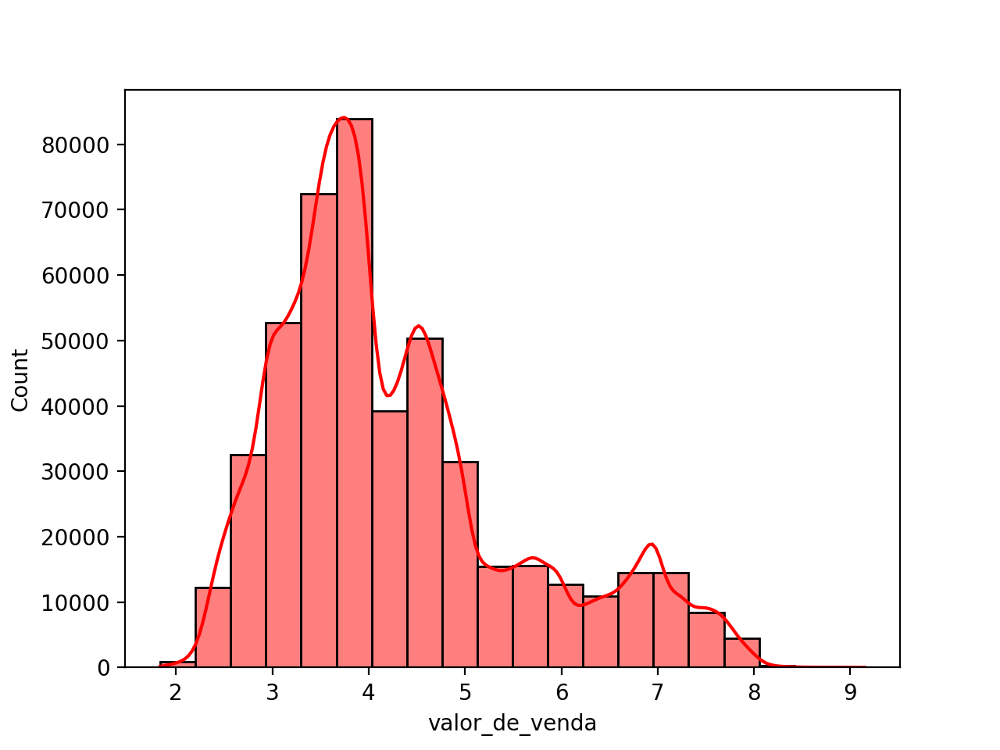

In [254]:
sns.histplot(data=centro_oeste_df, x='valor_de_venda',bins=20, kde=True, color='r')
plt.show()

- **Região Sudeste**

In [255]:
def filtrar_combustivel_ano(df:pd.DataFrame, combustivel:str, anos:int|List[int]) -> pd.DataFrame:
    if type(anos) == list:
        return df.loc[(df['produto']==combustivel)&(df['ano'].isin(anos))]
    else:
        return df.loc[(df['produto']==combustivel)&(df['ano']==anos)]

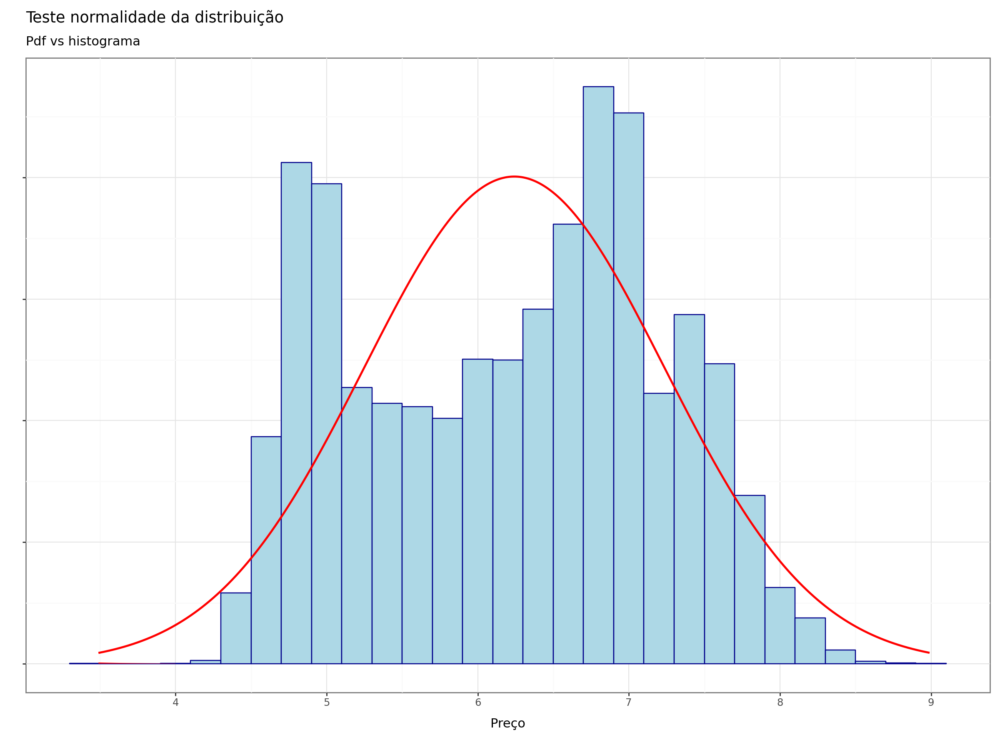

<Figure Size: (1200 x 900)>

In [256]:
ANOS = [*range(2017, 2023)]

# Para plotar o teste da distribuição, basta alterar o argumento anos e o combustível desejados
COMBUSTIVEL_ANO_DF=filtrar_combustivel_ano(sudeste_df, anos=ANOS[-1], combustivel='GASOLINA')

mu, std_ = norm.fit(COMBUSTIVEL_ANO_DF['valor_de_venda'])


x = np.linspace(COMBUSTIVEL_ANO_DF['valor_de_venda'].min(),
                COMBUSTIVEL_ANO_DF['valor_de_venda'].max(), 
                1000
               )

p = norm.pdf(x, mu, std_)

cdf = norm.cdf(COMBUSTIVEL_ANO_DF['valor_de_venda'], 
               mu, 
               std_
              )


p=(
    ggplot(COMBUSTIVEL_ANO_DF, aes(x='valor_de_venda'))
    +geom_histogram(
        data=COMBUSTIVEL_ANO_DF, 
        mapping=aes(x='valor_de_venda',
                    y=after_stat('density')
                    ),
        binwidth=.2,
        fill='lightblue',
        color='darkblue'
        )
    +labs(
        x='Preço',
        y='',
        title='Teste normalidade da distribuição',
        subtitle='Pdf vs histograma'
    )
    +theme_bw()
    +theme(
        axis_text_y=element_blank(),
        figure_size=(12,9)
    )
    +stat_function(
        fun=norm.pdf, 
        n=len(COMBUSTIVEL_ANO_DF
             ), 
        args=(COMBUSTIVEL_ANO_DF['valor_de_venda'].mean(),
              COMBUSTIVEL_ANO_DF['valor_de_venda'].std()), 
        color='r', 
        size=1
    )
    +geom_area(stat="function", fun=norm.pdf, fill='r', xlim=(COMBUSTIVEL_ANO_DF['valor_de_venda'].min(), 4.00)) # tentativa de hachurar a area sob a curva
)

p

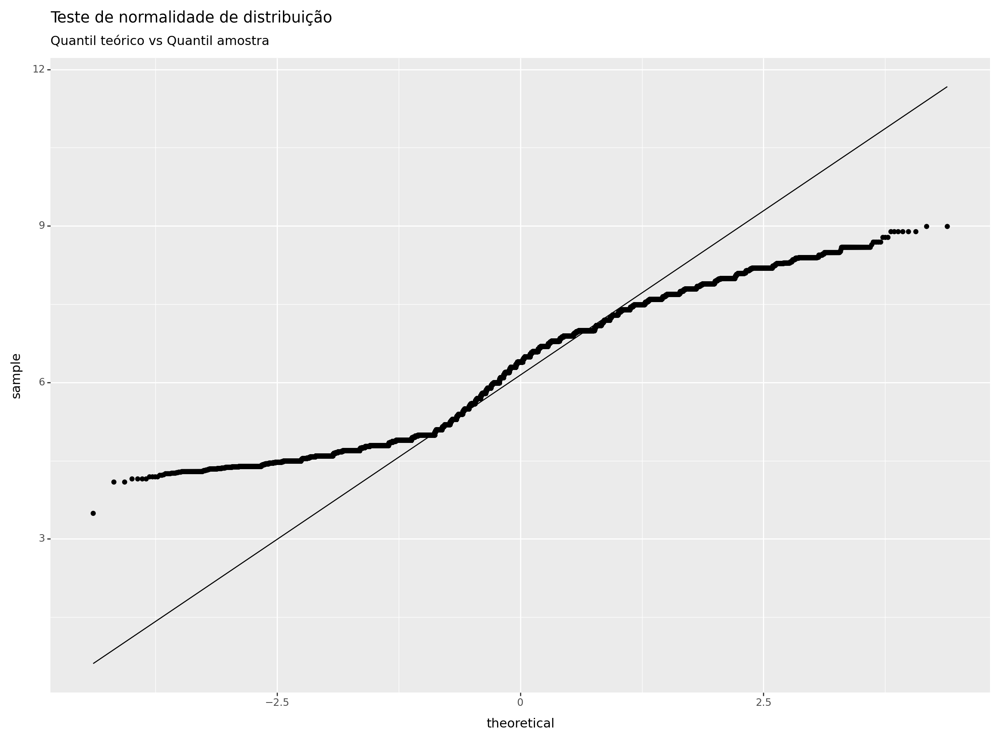

<Figure Size: (1200 x 900)>

In [257]:
(
    ggplot(COMBUSTIVEL_ANO_DF, aes(sample='valor_de_venda'))
    +stat_qq()
    +stat_qq_line()
    +theme(figure_size=(12,9))
    +labs(
        title='Teste de normalidade de distribuição',
        subtitle='Quantil teórico vs Quantil amostra'
    )
)

- **Região Sul**

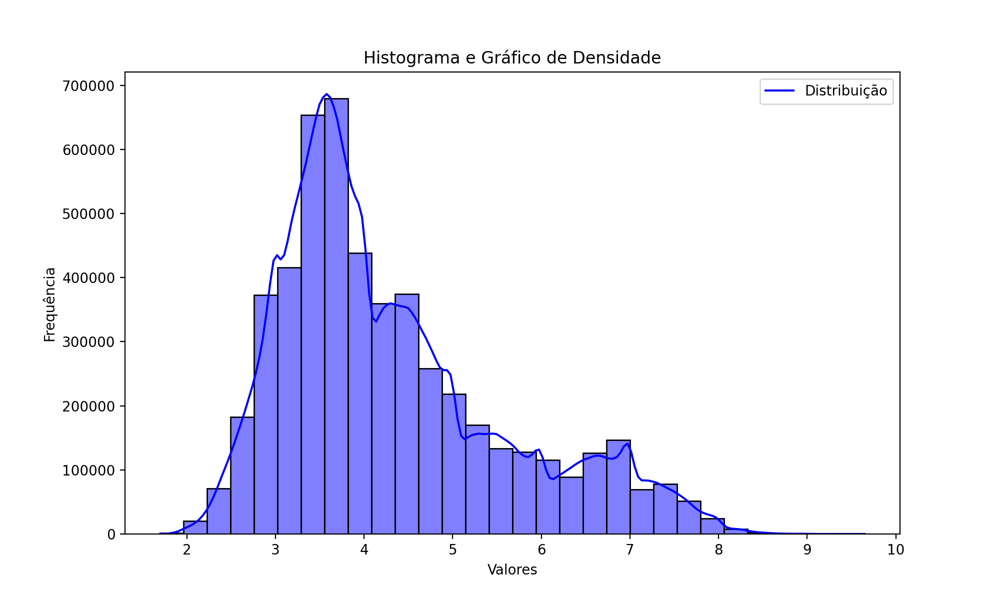

In [258]:
# Gerar dados fictícios com uma distribuição normal
np.random.seed(42)
data = np.random.normal(loc=0, scale=1, size=1000)

# Criar subplots para sobreposição de histograma e gráfico de densidade
plt.figure(figsize=(10, 6))

# Histograma com estimativa de densidade
sns.histplot(precos_df['valor_de_venda'], color='blue', bins=30, kde=True, ax=plt.gca())
plt.title('Histograma e Gráfico de Densidade')
plt.xlabel('Valores')
plt.ylabel('Frequência')

plt.legend(['Distribuição'])
plt.show()

Analisando o gráfico acima, podemos dizer que os preços mais prováveis para os combustíveis são entre 3 e 4 reais,e portanto, podemos dizer que a distribuição não é normal/perfeita. 

- **Região Norte**

In [259]:
x = np.arange(-3, 3, 0.001)
norm_dist = pd.DataFrame({'z': x,
                         'prob': norm.cdf(x)})
norm_dist

,z,prob
0,-3.0000,0.0013
1,-2.9990,0.0014
2,-2.9980,0.0014
3,-2.9970,0.0014
4,-2.9960,0.0014
...,...,...
5995,2.9950,0.9986
5996,2.9960,0.9986
5997,2.9970,0.9986
5998,2.9980,0.9986


In [260]:
gasolina_2022_norte=norte_df.loc[norte_df['produto'] == 'GASOLINA'][['valor_de_venda']]
desvio_padrao = gasolina_2022_norte['valor_de_venda'].std()
media = gasolina_2022_norte['valor_de_venda'].mean()
gasolina_2022_norte['zscore'] = gasolina_2022_norte['valor_de_venda'].apply(lambda x: (x - media)/desvio_padrao)
gasolina_2022_norte['prob'] = norm.cdf(gasolina_2022_norte['zscore'].values)
gasolina_2022_norte.sort_values('zscore')[gasolina_2022_norte['valor_de_venda'] <= 3.89]['prob'].values[-1]

C:\Users\mohar\AppData\Local\Temp\ipykernel_8432\3606202637.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


0.15477074899626347

In [261]:
gasolina_2022_norte.head()

,valor_de_venda,zscore,prob
17,4.7000,-0.2351,0.4071
19,4.7000,-0.2351,0.4071
21,4.4700,-0.4569,0.3239
24,4.7000,-0.2351,0.4071
26,4.4300,-0.4955,0.3101


c:\Users\mohar\AppData\Local\Programs\Python\Python311\Lib\site-packages\plotnine\geoms\geom_path.py:98: PlotnineWarning: geom_path: Removed 106 rows containing missing values.


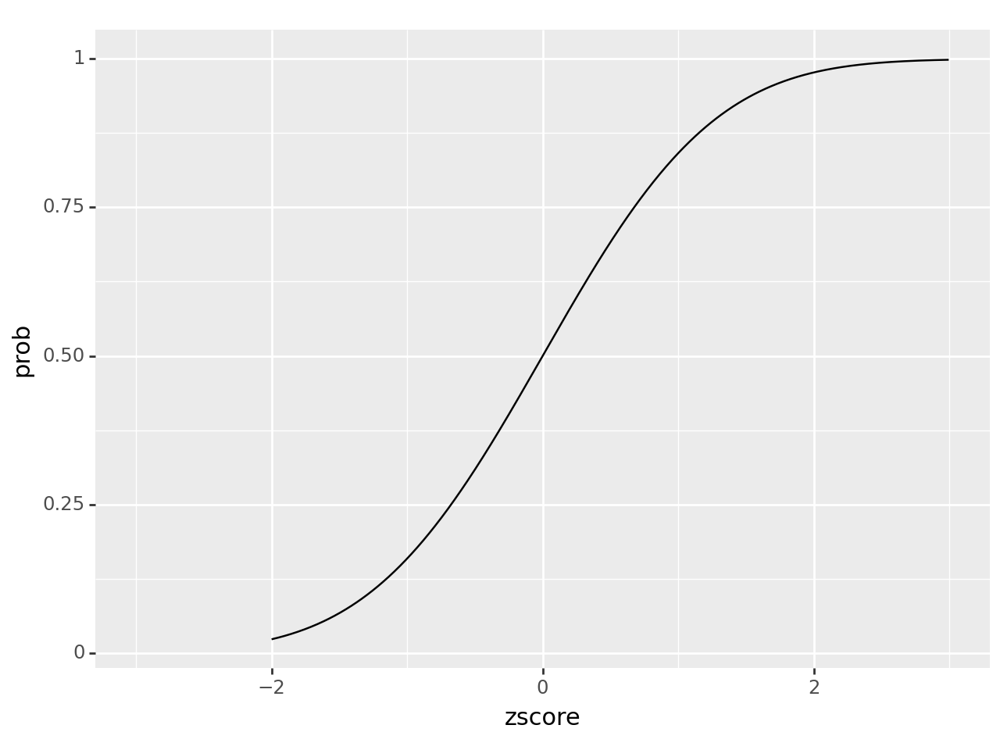

<Figure Size: (640 x 480)>

In [262]:
(
    ggplot()
    +geom_line(data=gasolina_2022_norte,
              mapping=aes(x='zscore', y='prob'))
    +scale_x_continuous(limits=[-3, 3])
)

- **Região Nordeste**

In [263]:
gasolina_2022_nordeste=nordeste_df.loc[nordeste_df['produto'] == 'GASOLINA'][['valor_de_venda']]
desvio_padrao = gasolina_2022_nordeste['valor_de_venda'].std()
media = gasolina_2022_nordeste['valor_de_venda'].mean()
gasolina_2022_nordeste['zscore'] = gasolina_2022_nordeste['valor_de_venda'].apply(lambda x: (x - media)/desvio_padrao)
gasolina_2022_nordeste['prob'] = norm.cdf(gasolina_2022_nordeste['zscore'].values)
gasolina_2022_nordeste.sort_values('zscore')[gasolina_2022_nordeste['valor_de_venda'] <= 3.89]['prob'].values[-1]

C:\Users\mohar\AppData\Local\Temp\ipykernel_8432\358455635.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


0.18836738870117137

In [264]:
gasolina_2022_nordeste.head()

,valor_de_venda,zscore,prob
11,3.7800,-0.9867,0.1619
83,3.6490,-1.1092,0.1337
86,3.9990,-0.7820,0.2171
90,3.7990,-0.9690,0.1663
94,3.8000,-0.9681,0.1665


c:\Users\mohar\AppData\Local\Programs\Python\Python311\Lib\site-packages\plotnine\geoms\geom_path.py:98: PlotnineWarning: geom_path: Removed 1432 rows containing missing values.


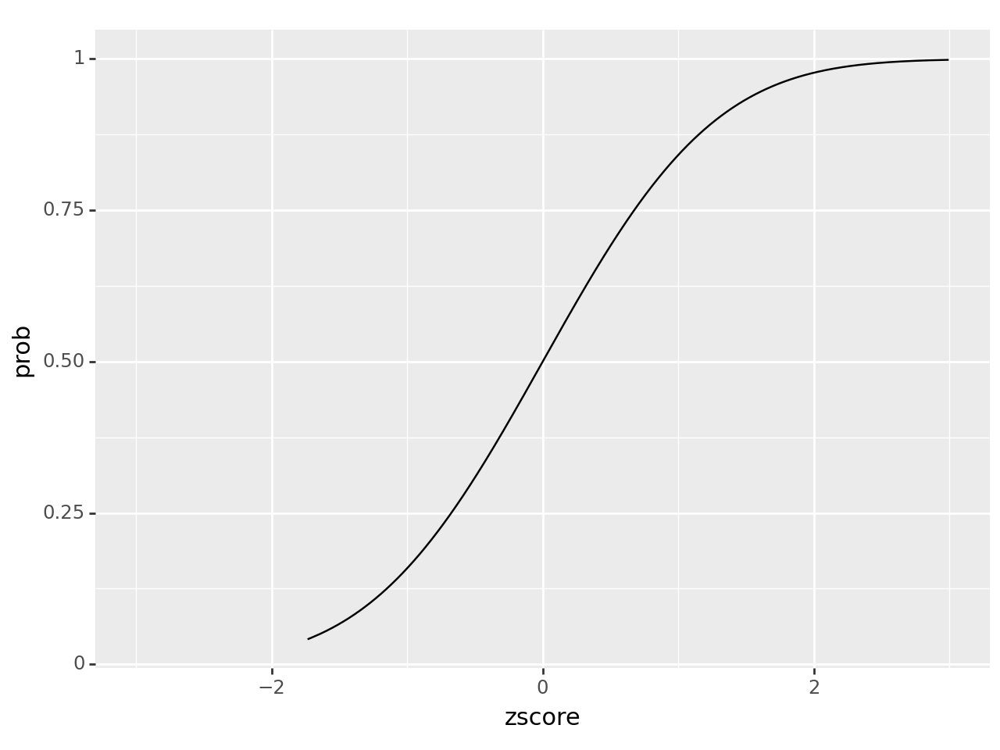

<Figure Size: (640 x 480)>

In [265]:
(
    ggplot()
    +geom_line(data=gasolina_2022_nordeste,
              mapping=aes(x='zscore', y='prob'))
    +scale_x_continuous(limits=[-3, 3])
)

**4.5 - Como a quantidade de vendas de combustíveis influenciou nos preços de combustíveis? (Análise por anos e regiões)** 

- **Região Centro-Oeste**

In [266]:
centro_oeste_vendas_df = vendas_df.loc[vendas_df['regiao'] == 'CO']
centro_oeste_vendas_df.reset_index(inplace=True)

centro_oeste_precos_df = precos_corr_df.drop(['bandeira'], axis=1)
centro_oeste_precos_df = precos_corr_df.loc[precos_corr_df['regiao'] == 'CO']
centro_oeste_precos_df = centro_oeste_precos_df.replace('DIESEL S10','DIESEL')
centro_oeste_precos_df.reset_index(inplace=True)


In [267]:
m_prec_vend = pd.merge(centro_oeste_vendas_df, centro_oeste_precos_df, how = 'inner', on = ['data','produto','regiao'])
m_prec_vend.drop_duplicates(subset=['data','produto'],inplace=True)
m_prec_vend.dropna(inplace=True)
m_prec_vend

,data,regiao,produto,vendas,bandeira,mean,median,min,max
0,2017-01,CO,ETANOL,119784.3100,PETROLUZ,2.6980,2.6220,2.6220,2.8500
17,2017-01,CO,GASOLINA,346785.2460,PETROLUZ,3.6960,3.6190,3.6190,3.8500
34,2017-01,CO,DIESEL,512376.7775,RIO BRANCO,3.2618,3.3000,3.2000,3.3000
83,2017-02,CO,GASOLINA,337345.7000,ALESAT,3.8132,3.8600,3.4900,4.1900
101,2017-02,CO,DIESEL,587752.1258,BRANCA,3.3664,3.3400,3.0790,3.8800
...,...,...,...,...,...,...,...,...,...
4653,2022-11,CO,GASOLINA,345190.2450,MASUT DISTRIBUIDORA,4.9967,4.9950,4.7700,5.2500
4667,2022-11,CO,DIESEL,714425.4580,ATEM' S,6.4900,6.4900,6.4900,6.4900
4691,2022-12,CO,ETANOL,211377.4090,RAIZEN,3.8141,3.7700,3.3900,4.5900
4703,2022-12,CO,GASOLINA,401098.9530,VIBRA ENERGIA,5.0076,4.9900,4.5900,5.6900


Nesta análise optei por verificar combustível a combustível para facilitar a visualização.

**Etanol:**

In [268]:
etanol_df = m_prec_vend.loc[m_prec_vend['produto'] == 'ETANOL']

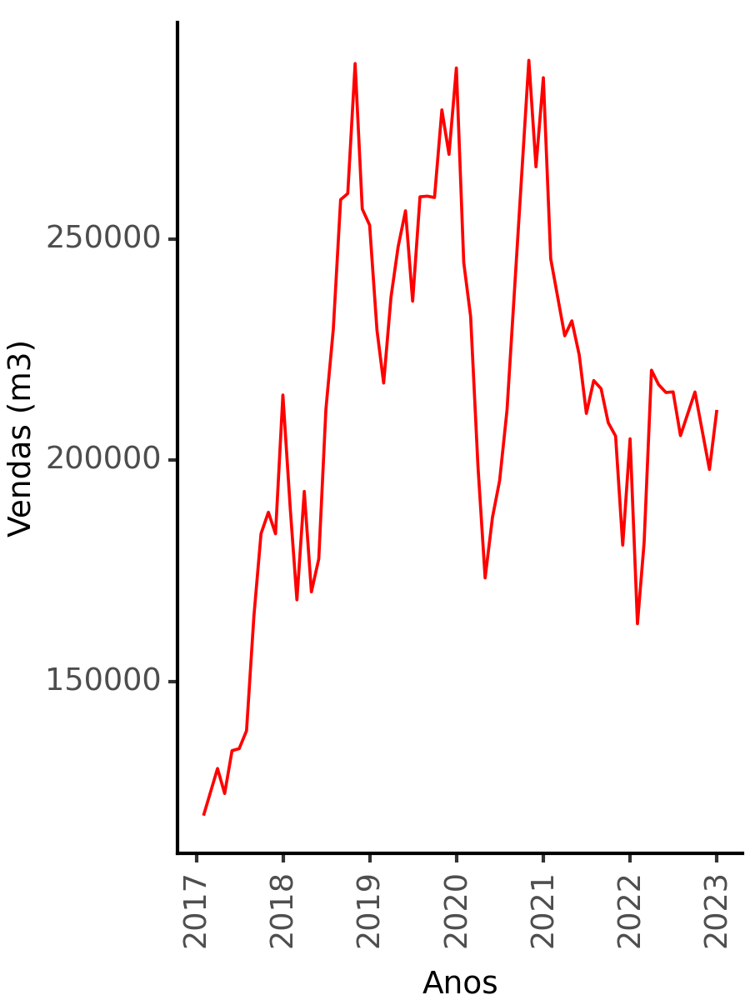

<Figure Size: (450 x 600)>

In [269]:
(
    ggplot(etanol_df, aes(x='data', y='vendas'))+geom_line(mapping=aes(group='produto'), color="red")+theme_classic()+theme(axis_text_x=element_text(angle=90),figure_size=(3,4), dpi=150, axis_title_y=element_text(text='Vendas (m3)', size=9), axis_title_x=element_text(text='Anos', size=9, vjust=0.5))+ scale_x_date(date_labels = "%Y")
)

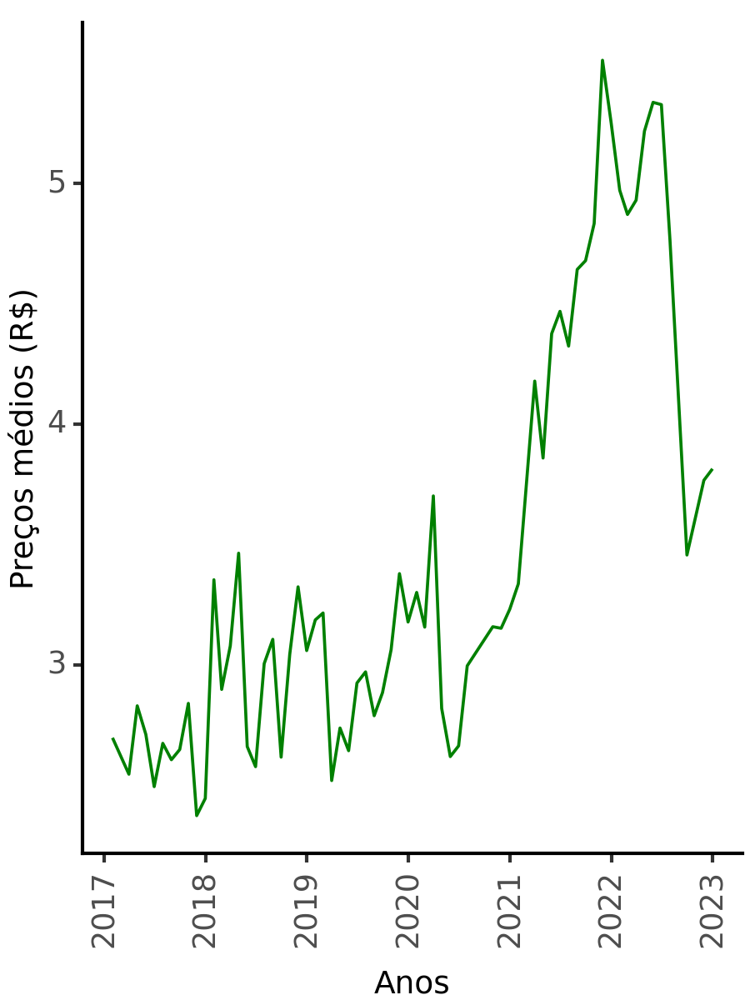

<Figure Size: (450 x 600)>

In [270]:
(
    ggplot(etanol_df, aes(x='data', y='mean'))+geom_line(mapping=aes(group='produto'), color="green")+theme_classic()+theme(axis_text_x=element_text(angle=90),figure_size=(3,4), dpi=150, axis_title_y=element_text(text='Preços médios (R$)', size=9), axis_title_x=element_text(text='Anos', size=9, vjust=0.5))+ scale_x_date(date_labels = "%Y")
)

Através dos dois gráficos acima, percebe-se que a lei da oferta e procura é comprovada, pois nos anos de baixa venda de combustível para as distribuidoras (de 2021.2 à 2022.2), os preços médios do etanol aumentaram.

**Gasolina:**

In [271]:
gasolina_df = m_prec_vend.loc[m_prec_vend['produto'] == 'GASOLINA']
gasolina_df

,data,regiao,produto,vendas,bandeira,mean,median,min,max
17,2017-01,CO,GASOLINA,346785.2460,PETROLUZ,3.6960,3.6190,3.6190,3.8500
83,2017-02,CO,GASOLINA,337345.7000,ALESAT,3.8132,3.8600,3.4900,4.1900
151,2017-03,CO,GASOLINA,385442.2350,PODIUM,3.5700,3.5800,3.5300,3.5900
219,2017-04,CO,GASOLINA,361072.6750,TAURUS,3.7392,3.7990,3.3990,3.9500
287,2017-05,CO,GASOLINA,373801.8210,PETROLUZ,3.5120,3.5400,3.4500,3.5400
...,...,...,...,...,...,...,...,...,...
4390,2022-07,CO,GASOLINA,325843.9820,VIBRA ENERGIA,5.9344,5.8900,5.1500,7.2700
4459,2022-08,CO,GASOLINA,360030.7930,ROYAL FIC,5.1667,5.1900,4.9500,5.2900
4593,2022-10,CO,GASOLINA,351714.2210,VIBRA ENERGIA,4.8786,4.8900,4.4900,5.2900
4653,2022-11,CO,GASOLINA,345190.2450,MASUT DISTRIBUIDORA,4.9967,4.9950,4.7700,5.2500


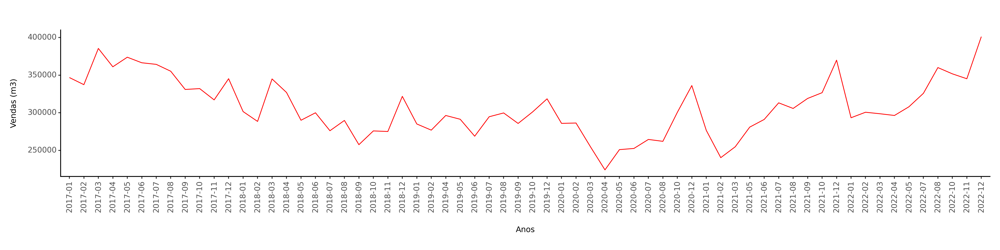

<Figure Size: (2400 x 600)>

In [272]:
(
    ggplot(gasolina_df, aes(x='data', y='vendas'))+geom_line(mapping=aes(group='produto'), color="red")+theme_classic()+theme(axis_text_x=element_text(angle=90),figure_size=(16,4), dpi=150, axis_title_y=element_text(text='Vendas (m3)', size=9), axis_title_x=element_text(text='Anos', size=9, vjust=0.5))
)

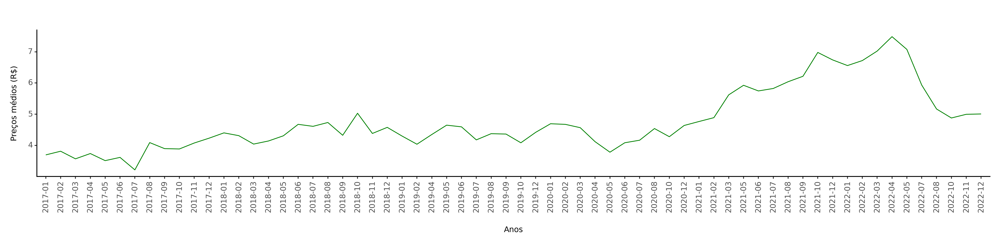

<Figure Size: (2400 x 600)>

In [273]:
(
    ggplot(gasolina_df, aes(x='data', y='mean'))+geom_line(mapping=aes(group='produto'), color="green")+theme_classic()+theme(axis_text_x=element_text(angle=90),figure_size=(16,4), dpi=150, axis_title_y=element_text(text='Preços médios (R$)', size=9), axis_title_x=element_text(text='Anos', size=9, vjust=0.5))
)

**Diesel**

In [274]:
diesel_df = m_prec_vend.loc[m_prec_vend['produto'] == 'DIESEL']

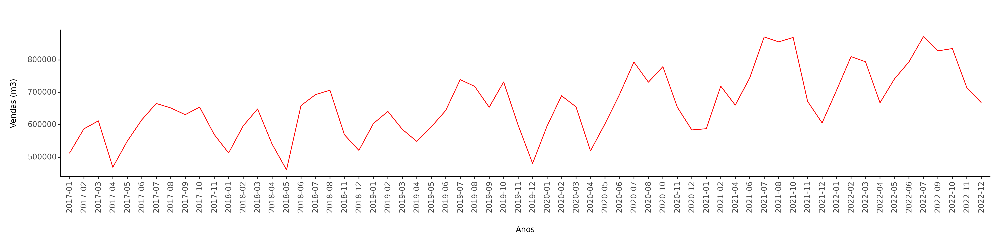

<Figure Size: (2400 x 600)>

In [275]:
(
    ggplot(diesel_df, aes(x='data', y='vendas'))+geom_line(mapping=aes(group='produto'), color="red")+theme_classic()+theme(axis_text_x=element_text(angle=90),figure_size=(16,4), dpi=150, axis_title_y=element_text(text='Vendas (m3)', size=9), axis_title_x=element_text(text='Anos', size=9, vjust=0.5))
)

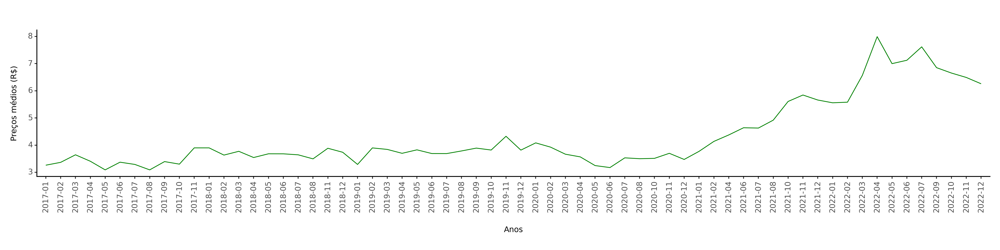

<Figure Size: (2400 x 600)>

In [276]:
(
    ggplot(diesel_df, aes(x='data', y='mean'))+geom_line(mapping=aes(group='produto'), color="green")+theme_classic()+theme(axis_text_x=element_text(angle=90),figure_size=(16,4), dpi=150, axis_title_y=element_text(text='Preços médios (R$)', size=9), axis_title_x=element_text(text='Anos', size=9, vjust=0.5))
)

A partir dos gráficos de vendas e preços percebe-se que o Etanol teve variações de preço em ordem inversamente proporcional à variação de vendas, o que nos faz pensar que a correlação entre eles é negativa. Enquanto a Gasolina e o Diesel não tiveram variações acentuadas de comportamente e devem ser melhor investigadas. Para que isso seja melhor interpretado, serão feitos gráficos de dispersão para identificar a correlação entre preço e venda de cada combustível.

c:\Users\mohar\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight


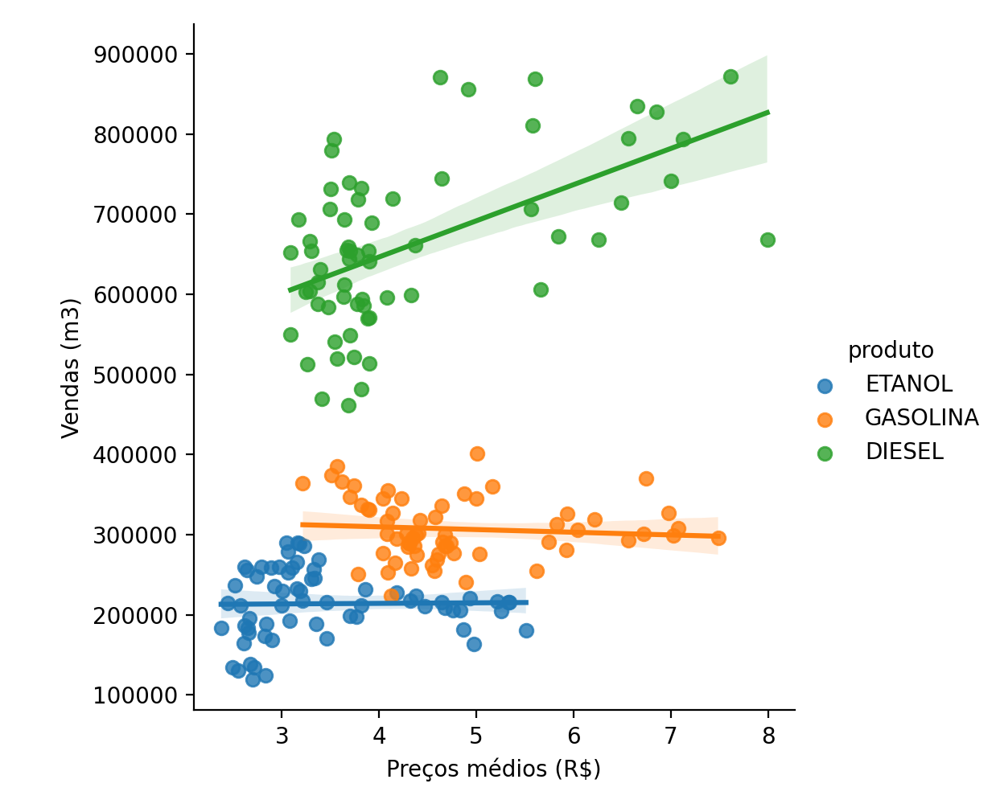

In [277]:
# gráfico gerado a partir do dataframe resultante do merge do df de preços e vendas
sns.lmplot(data=m_prec_vend, x="mean", y="vendas", hue="produto")
plt.xlabel("Preços médios (R$)") 
plt.ylabel("Vendas (m3)") 
plt.show()

A partir do gráfico exposto, é possível ver que referente ao preço e venda, o Diesel apresentou correlação positiva fraca, enquanto a Gasolina apresentou correlação negativa fraca e o etanol teve correlação aproximadamente nula. A seguir tem os gráficos de correlação de cada combustível, onde isso fica melhor elucidado.

**Diesel**

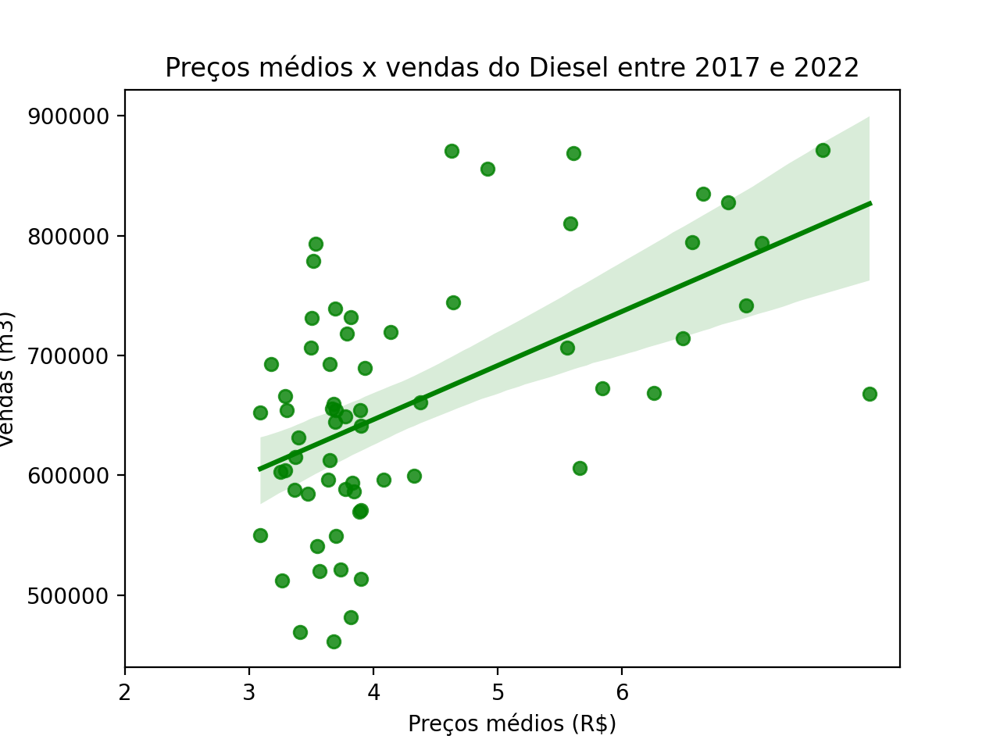

In [278]:
# gráfico que mostra a correlação por regressão linear (Diesel)
sns.regplot(x = "mean",
            y = "vendas",
            data = diesel_df,
            line_kws={'color': 'green'},
            scatter_kws={"color": 'green'})
plt.xticks(np.arange(2, 7))
plt.xlabel("Preços médios (R$)") 
plt.ylabel("Vendas (m3)") 
plt.title('Preços médios x vendas do Diesel entre 2017 e 2022')
plt.show()

**Gasolina**

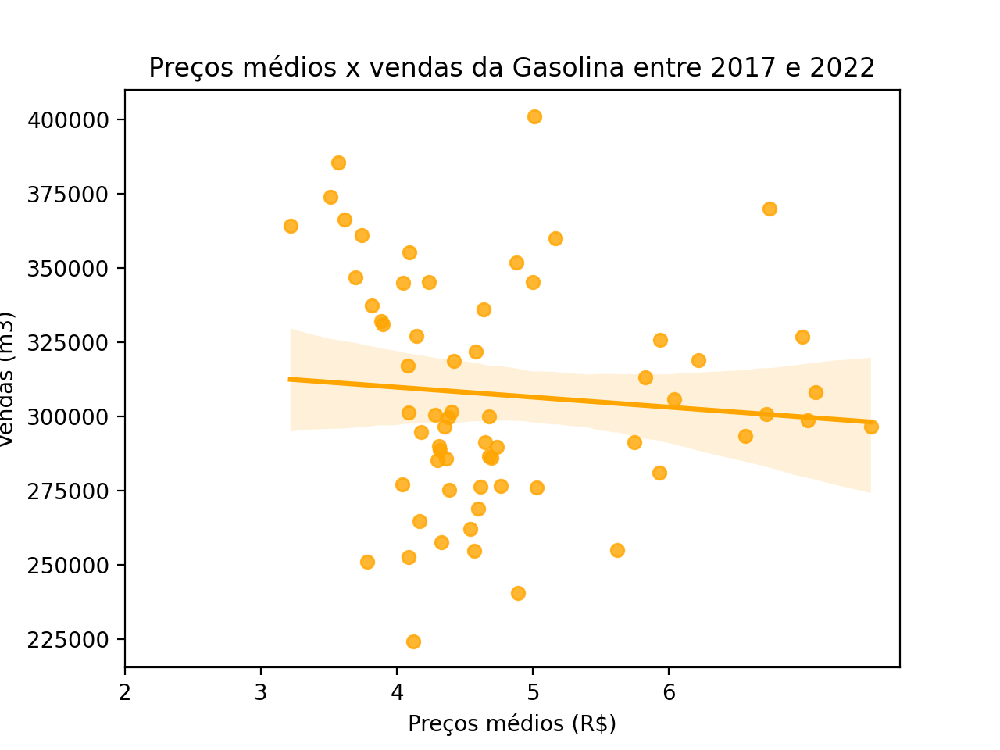

In [279]:
# gráfico que mostra a correlação por regressão linear (Gasolina)
sns.regplot(x = "mean",
            y = "vendas",
            data = gasolina_df,
            line_kws={'color': 'orange'},
            scatter_kws={"color": 'orange'})
plt.xticks(np.arange(2, 7))
plt.xlabel("Preços médios (R$)") 
plt.ylabel("Vendas (m3)") 
plt.title('Preços médios x vendas da Gasolina entre 2017 e 2022')
plt.show()

**Etanol**

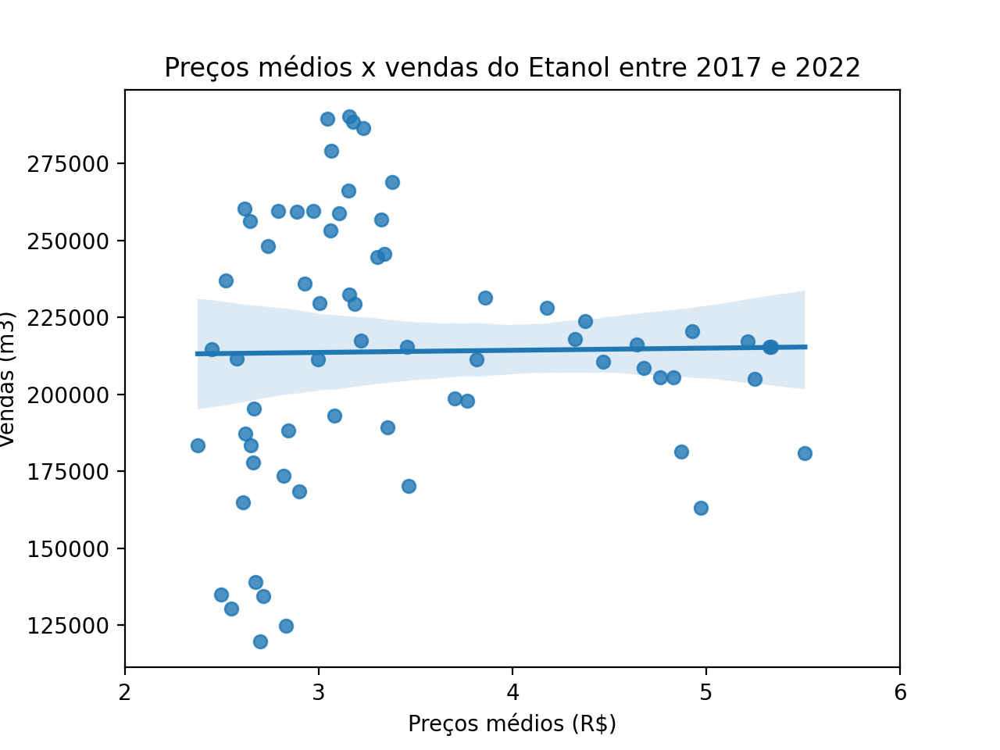

In [280]:
# gráfico que mostra a correlação por regressão linear para o Etanol
sns.regplot(x = "mean",
            y = "vendas",
            data = etanol_df,
            )
plt.xticks(np.arange(2, 7))
plt.xlabel("Preços médios (R$)") 
plt.ylabel("Vendas (m3)") 
plt.title('Preços médios x vendas do Etanol entre 2017 e 2022')
plt.show()

- **Região Sudeste**

In [281]:
vendas_se_final = vendas_df.loc[vendas_df['regiao'] == 'SE']
vendas_se_final.rename(columns={"regiao": "REGIAO", "produto": "PRODUTO", 'vendas': 'VENDAS'}, inplace=True)
vendas_se_final = vendas_se_final.reset_index()

vendas_se_final.head(10)

C:\Users\mohar\AppData\Local\Temp\ipykernel_8432\2235576672.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,data,REGIAO,PRODUTO,VENDAS
0,2017-01,SE,ETANOL,618785.3170
1,2017-01,SE,GASOLINA,1584992.9320
2,2017-01,SE,DIESEL,1561529.3867
3,2017-02,SE,ETANOL,620411.9370
4,2017-02,SE,GASOLINA,1542412.2040
5,2017-02,SE,DIESEL,1591883.7768
6,2017-03,SE,ETANOL,725405.1220
7,2017-03,SE,GASOLINA,1693032.3520
8,2017-03,SE,DIESEL,1936845.0428
9,2017-04,SE,ETANOL,713170.1980


In [282]:
#.set_index('data', drop=True).
precos_times_series_df=precos_df.set_index('data', drop=True)\
.groupby(['regiao_sigla', 'produto'])\
.resample('M')['valor_de_venda']\
.agg([np.mean, np.median, np.min, np.max])\
.reset_index().sort_index()

In [283]:
# Filtrando a região Sudeste
precos_times_series_df=precos_times_series_df.loc[precos_times_series_df['regiao_sigla'] == 'SE'].copy()

# convertendo data para objeto pd.period
precos_times_series_df=precos_times_series_df.assign(data=precos_times_series_df['data'].apply(lambda x: x.to_period('M')))

In [284]:
# Considerando DIESEL e DIESEL S10 juntos
precos_times_series_df=precos_times_series_df.assign(
    produto=precos_times_series_df['produto'].apply(lambda x: 'DIESEL' if x == 'DIESEL S10' else x)
)

In [285]:
precos_times_series_df.rename(columns={"data": 'data_da_coleta'}, inplace=True)

precos_times_series_df.head(3)

,regiao_sigla,produto,data_da_coleta,mean,median,min,max
1548,SE,DIESEL,2017-01,3.0619,3.0590,2.4590,3.6500
1549,SE,DIESEL,2017-02,3.0681,3.0790,2.5770,3.6500
1550,SE,DIESEL,2017-03,3.0242,2.9990,2.4590,3.6900


In [286]:
precos_times_series_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 387 entries, 1548 to 1934
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype    
---  ------          --------------  -----    
 0   regiao_sigla    387 non-null    object   
 1   produto         387 non-null    object   
 2   data_da_coleta  387 non-null    period[M]
 3   mean            382 non-null    float64  
 4   median          382 non-null    float64  
 5   min             382 non-null    float64  
 6   max             382 non-null    float64  
dtypes: float64(4), object(2), period[M](1)
memory usage: 24.2+ KB


In [287]:
# Aplicando um merge
corr_df=precos_times_series_df\
    .merge(vendas_se_final, left_on=['data_da_coleta', 'produto'], right_on=['data', 'PRODUTO'])\
    .drop(columns=['PRODUTO', 'regiao_sigla', 'data_da_coleta'])

In [288]:
corr_df.head(3)

,produto,mean,median,min,max,data,REGIAO,VENDAS
0,DIESEL,3.0619,3.0590,2.4590,3.6500,2017-01,SE,1561529.3867
1,DIESEL,3.2007,3.1990,2.6990,3.8990,2017-01,SE,1561529.3867
2,DIESEL,3.0681,3.0790,2.5770,3.6500,2017-02,SE,1591883.7768


In [289]:
disp_df=corr_df.groupby(['data', 'produto'], as_index=False)[['mean', 'VENDAS']].mean()
disp_df.rename(columns={'mean': 'preco_medio', 'VENDAS': 'vendas'}, inplace=True)

Os dados sugerem uma correlação linear negativa (esperada) entre preços médios de vendas e o volume vendido?

In [290]:
def stats_df(df:pd.DataFrame, produtos:list):
    final_dict = {}
    for prod in produtos:
        stat_df=df.loc[df['produto'] == prod]
        slope, intercept, r_value, p_value, std_err = linregress(stat_df['preco_medio'],stat_df['vendas'])
        final_dict.update({f'{prod}': {
            'theta': slope,
            'beta': intercept,
            'R^2':r_value
        }})
    return final_dict

In [291]:
def corr_ano(produto:str):
    return disp_df.loc[disp_df['produto']==produto][['preco_medio', 'vendas']].corr().loc['preco_medio', 'vendas']

In [292]:
combustiveis = disp_df['produto'].unique()
final_dict={}
for comb in combustiveis:
    print(f'Coeficiente Linear de Pearson {comb}: {corr_ano(comb)}')
    final_dict.update({comb:{
        'Coeficiente Linear de Pearson': corr_ano(comb),
        'Coeficiente de determinação ($R^2$)': corr_ano(comb)**2 *100
    }})

Coeficiente Linear de Pearson DIESEL: 0.4404913253959964
Coeficiente Linear de Pearson ETANOL: -0.31302248702082397
Coeficiente Linear de Pearson GASOLINA: 0.05696117655117078


In [293]:
coefs_df=pd.DataFrame(final_dict)
coefs_df

,DIESEL,ETANOL,GASOLINA
Coeficiente Linear de Pearson,0.4405,-0.3130,0.0570
Coeficiente de determinação ($R^2$),19.4033,9.7983,0.3245


c:\Users\mohar\AppData\Local\Programs\Python\Python311\Lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 3 rows containing missing values.


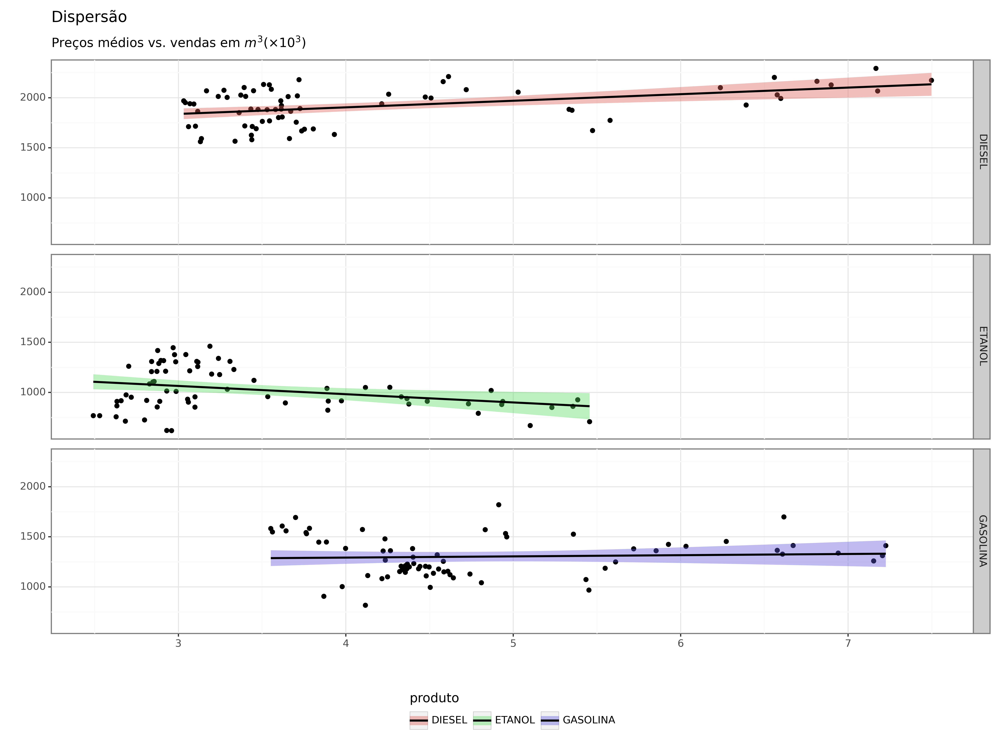

<Figure Size: (3360 x 2520)>

In [294]:
(
    ggplot(disp_df, aes(x='preco_medio', y='vendas/1000'))
    +geom_point()
    +facet_grid('produto~.')
    +geom_smooth(mapping=aes(fill='produto'), method='lm')
    +labs(title='Dispersão', 
          subtitle='Preços médios vs. vendas em $m^3 (\\times10^3)$',
          x='',
          y=''          
         )
    +theme_bw()
    +theme(
        figure_size=(12,9),
        dpi=280,
        legend_position='bottom'
    )
)

Os gráficos acima sugerem que para Etanol existe uma possível correlação linear negativa. Já para o Diesel, surpreendentemente, há indícios de correlação linear positiva. Em relação à gasolina, o gráfico de dispersão sugere que não há correlação linear entre preços médios e volume vendido.

- **Região Norte**

In [295]:
vendas_aux

,grande_região,unidade_da_federação,produto,vendas
data,,,,
2017-01,REGIÃO NORTE,AMAPÁ,ÓLEO DIESEL,9204.4257
2017-01,REGIÃO SUDESTE,ESPÍRITO SANTO,QUEROSENE DE AVIAÇÃO,3025.7160
2017-01,REGIÃO NORTE,ACRE,QUEROSENE ILUMINANTE,0.0000
2017-01,REGIÃO NORTE,ACRE,QUEROSENE DE AVIAÇÃO,1008.5600
2017-01,REGIÃO SUL,SANTA CATARINA,ÓLEO COMBUSTÍVEL,3865.0300
...,...,...,...,...
2022-12,REGIÃO CENTRO-OESTE,MATO GROSSO DO SUL,GASOLINA C,82828.3600
2022-12,REGIÃO NORTE,ACRE,GLP,3317.2935
2022-12,REGIÃO CENTRO-OESTE,MATO GROSSO,GASOLINA C,63713.8000


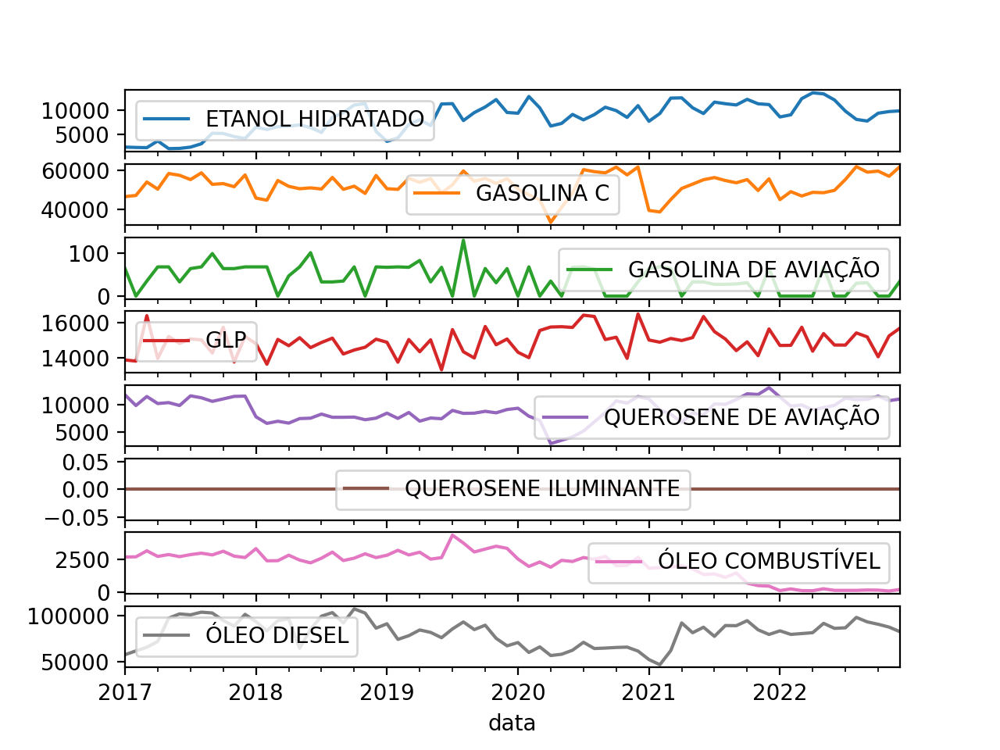

In [296]:
vendas_norte = vendas_aux.loc[vendas_aux['unidade_da_federação'].isin(['AMAZONAS', 
'PARÁ', 
'ACRE', 
'RORAIMA',
'RONDÔNIA',
'AMAPÁ',
'TOCANTINS'])]

vendas_norte.sort_index()

pivot_vendas_norte = vendas_norte.reset_index().pivot_table(index='data', columns=['unidade_da_federação', 'produto'], values='vendas')

pivot_vendas_norte['2017-01-31':'2022-12-31'].loc[:,'AMAZONAS'].plot(subplots=True)

plt.show()

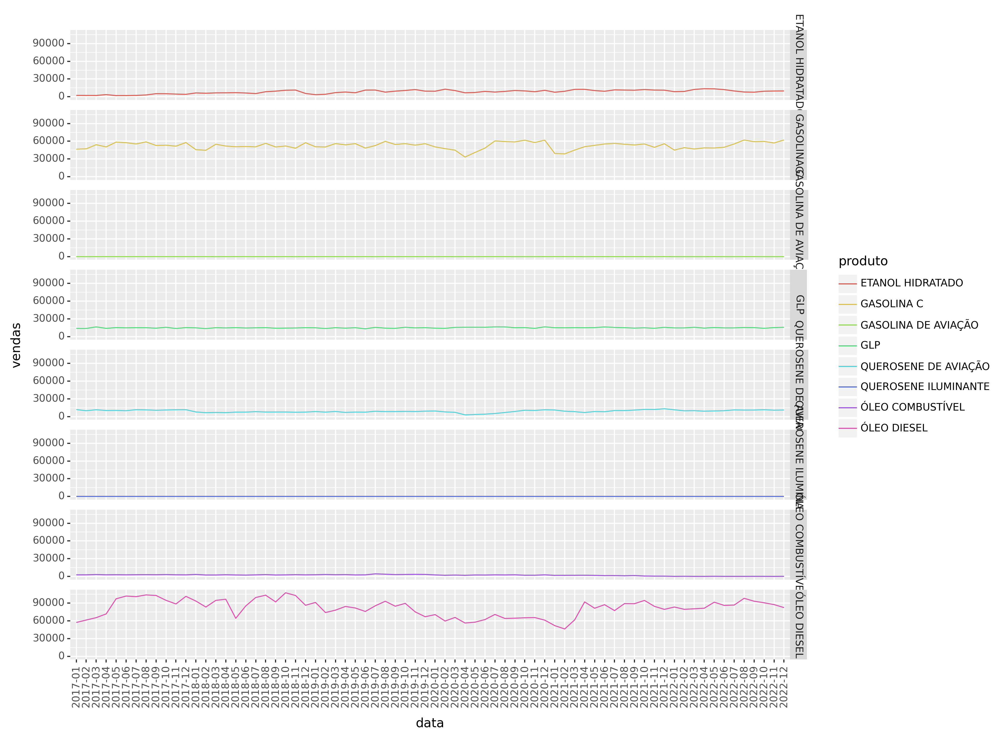

<Figure Size: (1800 x 1350)>

In [297]:
pivot_vendas_norte['2017-01-31':'2022-12-31']
vendas_amazonas = vendas_norte.sort_index().loc[vendas_norte.sort_index()['unidade_da_federação'] == 'AMAZONAS']['2017-01-31': '2022-12-31'].reset_index()

(
    ggplot(vendas_amazonas, aes(x='data', y='vendas', color='produto'))
    + geom_line(mapping=aes(group='produto'))
    + facet_grid('produto ~ .')
    + theme(axis_text_x=element_text(angle=90), figure_size=(12,9), dpi=150)
)

- **Região Nordeste**

In [298]:
vendas_aux

,grande_região,unidade_da_federação,produto,vendas
data,,,,
2017-01,REGIÃO NORTE,AMAPÁ,ÓLEO DIESEL,9204.4257
2017-01,REGIÃO SUDESTE,ESPÍRITO SANTO,QUEROSENE DE AVIAÇÃO,3025.7160
2017-01,REGIÃO NORTE,ACRE,QUEROSENE ILUMINANTE,0.0000
2017-01,REGIÃO NORTE,ACRE,QUEROSENE DE AVIAÇÃO,1008.5600
2017-01,REGIÃO SUL,SANTA CATARINA,ÓLEO COMBUSTÍVEL,3865.0300
...,...,...,...,...
2022-12,REGIÃO CENTRO-OESTE,MATO GROSSO DO SUL,GASOLINA C,82828.3600
2022-12,REGIÃO NORTE,ACRE,GLP,3317.2935
2022-12,REGIÃO CENTRO-OESTE,MATO GROSSO,GASOLINA C,63713.8000


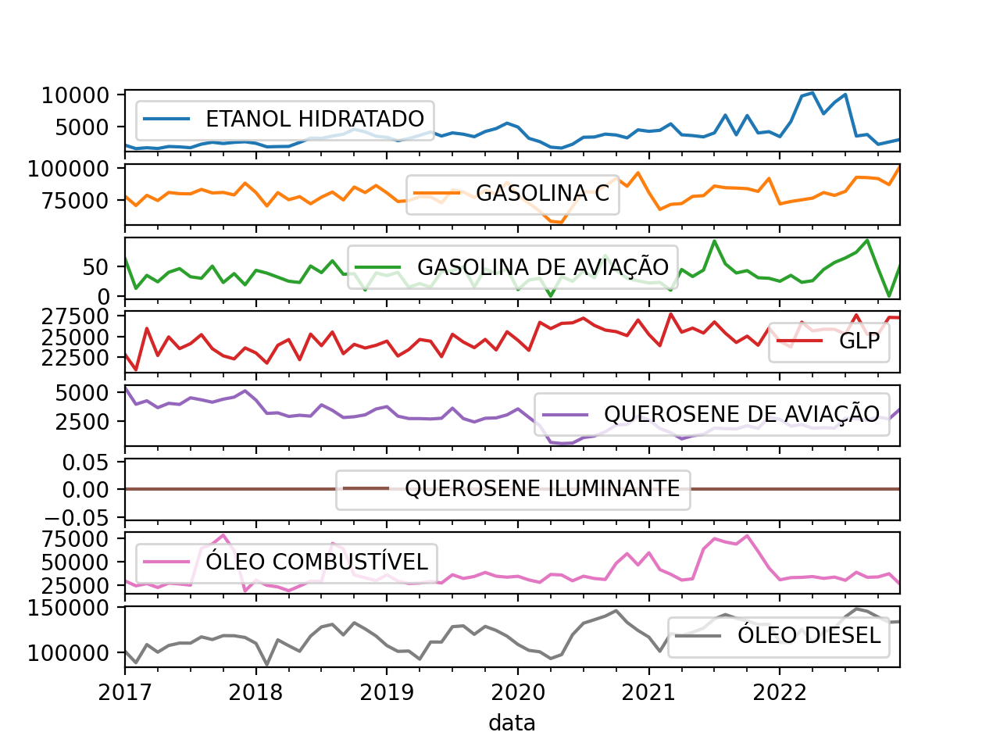

In [299]:
vendas_nordeste = vendas_aux.loc[vendas_aux['unidade_da_federação'].isin(['MARANHÃO', 
'PIAUÍ', 
'CEARÁ', 
'RIO GRANDE DO NORTE',
'PARAÍBA',
'PERNAMBUCO',
'ALAGOAS',
'SERGIPE',
'BAHIA'])]

vendas_nordeste.sort_index()

pivot_vendas_nordeste = vendas_nordeste.reset_index().pivot_table(index='data', columns=['unidade_da_federação', 'produto'], values='vendas')

pivot_vendas_nordeste['2017-01-31':'2022-12-31'].loc[:,'MARANHÃO'].plot(subplots=True)

plt.show()

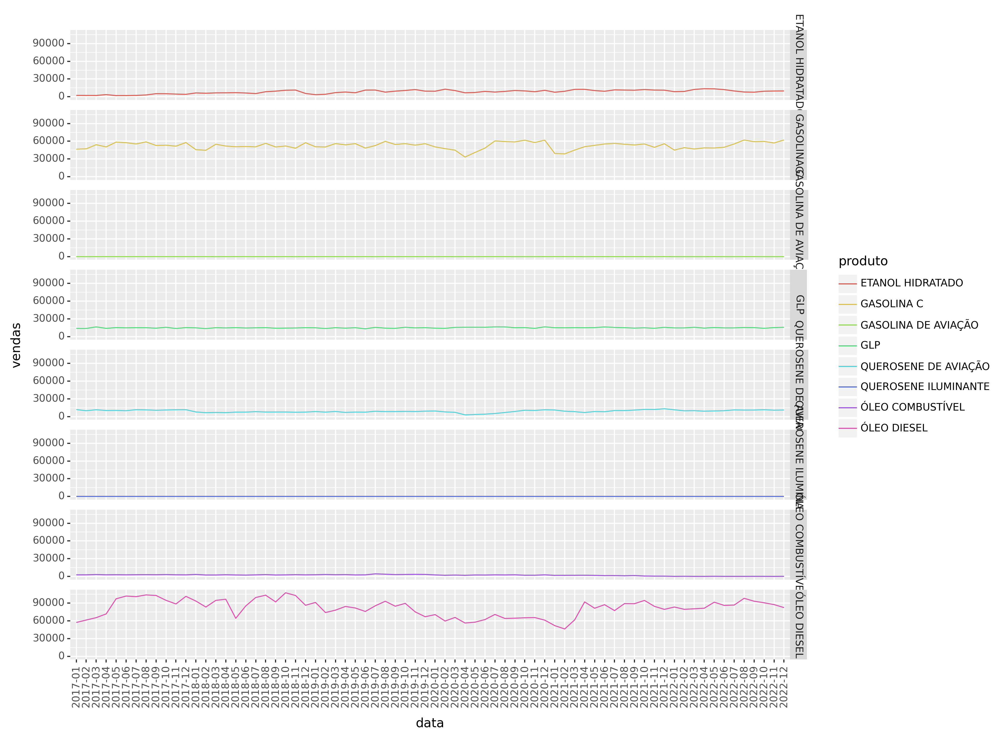

<Figure Size: (1800 x 1350)>

In [300]:
pivot_vendas_nordeste['2017-01-31':'2022-12-31']
vendas_maranhao = vendas_norte.sort_index().loc[vendas_norte.sort_index()['unidade_da_federação'] == 'MARANHÃO']['2017-01-31': '2022-12-31'].reset_index()

(
    ggplot(vendas_amazonas, aes(x='data', y='vendas', color='produto'))
    + geom_line(mapping=aes(group='produto'))
    + facet_grid('produto ~ .')
    + theme(axis_text_x=element_text(angle=90), figure_size=(12,9), dpi=150)
)

**4.6 - Análise dos outliers da região Sudeste** 

**Detecção de outliers por ano e por produto**

Quantos outliers por ano para cada combustível?

In [301]:
df=precos_df.assign(ano=lambda x: x.data.dt.year)
pd.set_option('display.float_format', lambda x: '%.4f' % x)

sudeste_df = df.loc[df['regiao_sigla'] == 'SE']
sudeste_df.describe()[['valor_de_venda']]

,valor_de_venda
count,2523012.0000
mean,4.1971
min,1.6990
25%,3.2890
50%,3.8780
75%,4.8800
max,9.6500
std,1.2868


In [302]:
def outliers_limits(x):
    quantiles=x['valor_de_venda'].quantile([.25, .75])

    IQR=np.diff(quantiles)[0]

    limite_superior=quantiles[.75] + 1.5*IQR
    limite_inferior=quantiles[.25] - 1.5*IQR

    return ((x['valor_de_venda'] > limite_superior) | (x['valor_de_venda'] < limite_inferior))

In [131]:
sudeste_df.groupby(['ano', 'produto', 'bandeira'])\
    .apply(outliers_limits).to_frame().reset_index()\
    .sort_values('level_3').groupby(['ano', 'produto', 'bandeira'])['valor_de_venda'].sum().to_frame()\
    .rename(columns={'valor_de_venda':'contagem_outliers'})

contagem_outliers
ano  produto bandeira                           
2017 DIESEL  ACOL                              0
             ALE COMBUSTÍVEIS                 14
             ALESAT                           31
             ATLÂNTICA                         8
             BRANCA                          347
...                                          ...
2022 GNV     TAURUS                            0
             TOBRAS                            1
             TORRAO                            0
             TOTALENERGIES                     0
             VIBRA ENERGIA                    48

[626 rows x 1 columns]